# 428_ra236.530_dec-46.922_4U1543

In [60]:
from pathlib import Path
import numpy as np
import arviz as az
import graphviz as gv
import matplotlib.pyplot as plt
import utility_functions as ufn
import importlib

importlib.reload(ufn)
az.style.use("arviz-white")

RANDOM_SEED = 2023-10-10
rng = np.random.default_rng(RANDOM_SEED)

OVERWRITE_TRACES = True

Running on PyMC v5.9.2


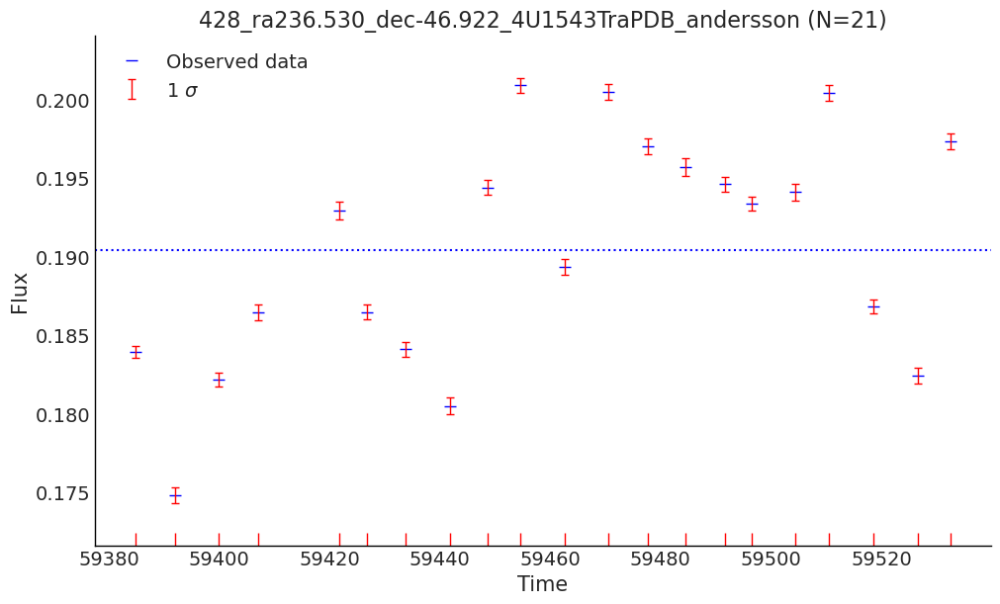

In [2]:
# File paths to CSVs of flux density observations.
csv_paths_list = sorted(list(Path('data_raw').iterdir()))
csv_path = csv_paths_list[1]
ufn.plot_lc(csv_path)

## SE Kernel only, Zero Mean Function

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{MVN}(\boldsymbol{0}, k_\textrm{SE}(\tau))$$

$$k_\textrm{SE}(\tau) = \eta \exp\left\{ - \frac{1}{2\ell^2}\tau^2\right\}$$

$$\ell \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\textrm{stderr}(y)]\;, \;\textrm{SD}[\textrm{stderr}(y)]\;)$$

Sampling: [ell_SE, eta_SE, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta_SE, ell_SE, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 59 seconds.
Sampling: [f_star, y_star]


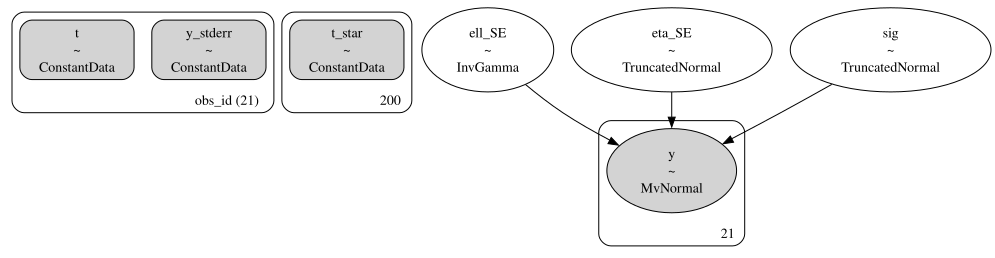

In [3]:
se0_trace_path = Path(f"traces/{csv_path.stem}_se0_idata.nc")
se0_dag_path = Path(f'dags/{csv_path.stem}_se0_dag.dot')

if se0_trace_path.is_file() and not OVERWRITE_TRACES:
    se0_trace = az.from_netcdf(se0_trace_path)
    se0_dag = gv.Source.from_file(se0_dag_path)
else:
    se0_trace, se0_dag = ufn.fit_se_gp(csv_path)
    az.to_netcdf(se0_trace, se0_trace_path)
    with open(se0_dag_path, 'w') as writehandle:
        writehandle.write(se0_dag.source)

gv.Source(se0_dag.source)

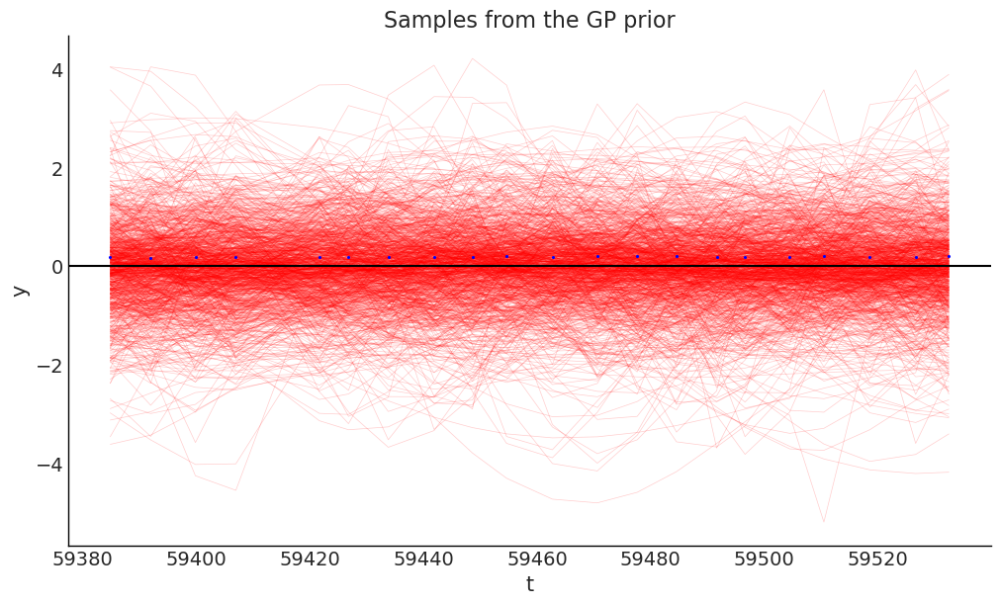

In [4]:
ufn.plot_priorpred_samples(se0_trace, variable_name="y")

In [62]:
variable_names = ["ell_SE", "eta_SE", "sig"]
ufn.print_post_summary(se0_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,12.376843,0.460028,11.655952,13.042997,1.411674e-02,3532.533646,3064.184405,1.002238,12.353217,0.689672
eta_SE,0.021854,0.006061,0.014738,0.034788,2.053810e-04,3695.549061,2620.044573,1.002224,0.025139,0.012903
sig,0.000494,0.000029,0.000453,0.000535,8.305157e-07,3461.516992,2725.985575,1.002291,0.000494,0.000040


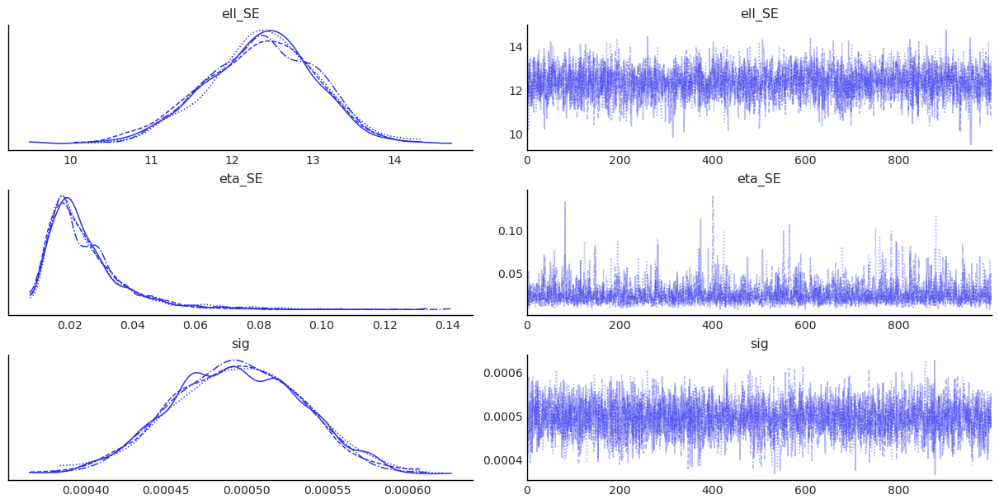

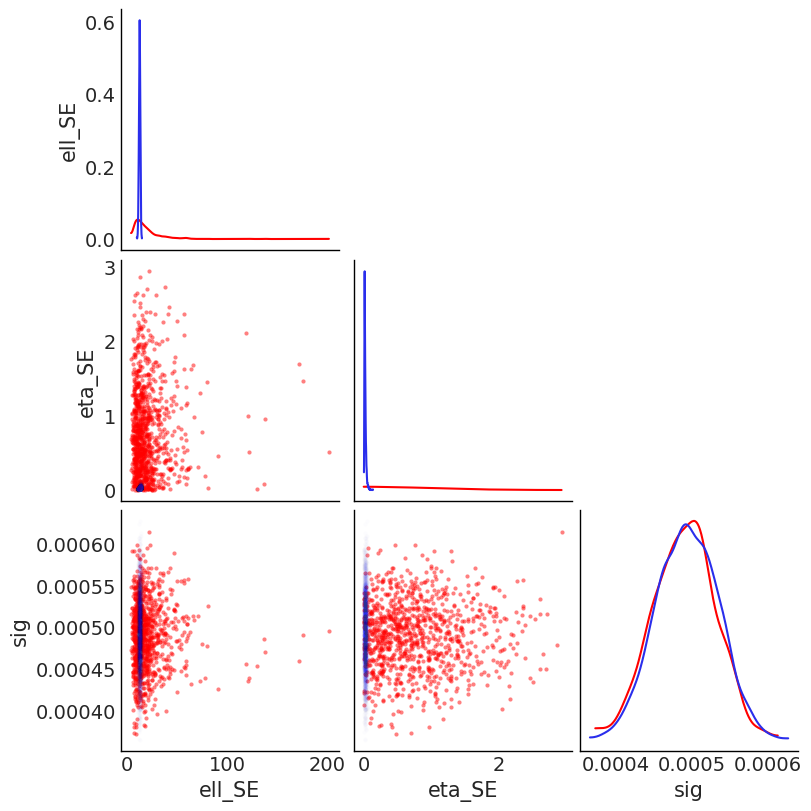

In [63]:
ufn.plot_traces(se0_trace, variable_names)
ufn.plot_priorpost_cnr(se0_trace, variable_names)

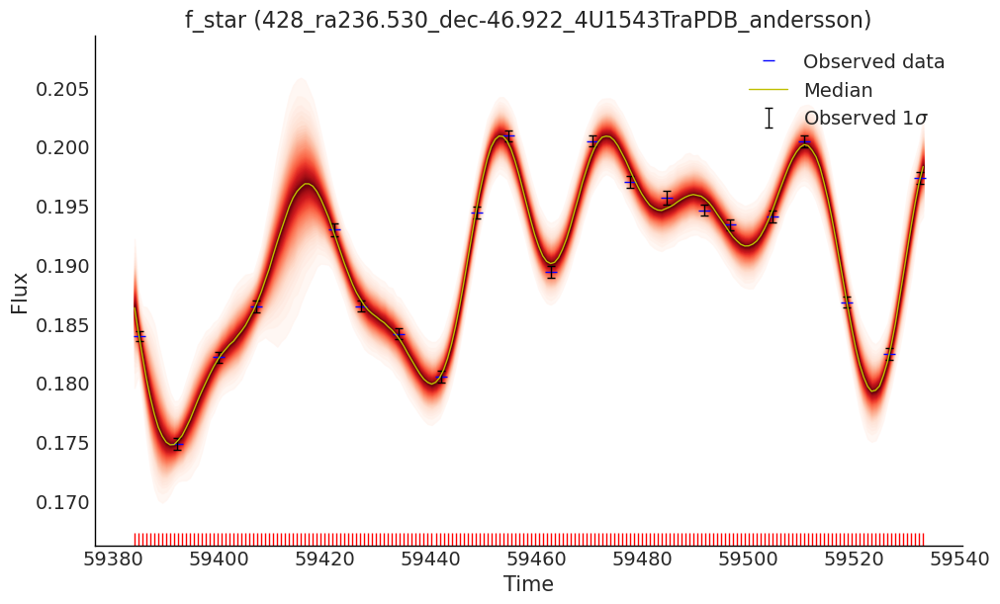

In [64]:
ufn.plot_postpred_samples(se0_trace)

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


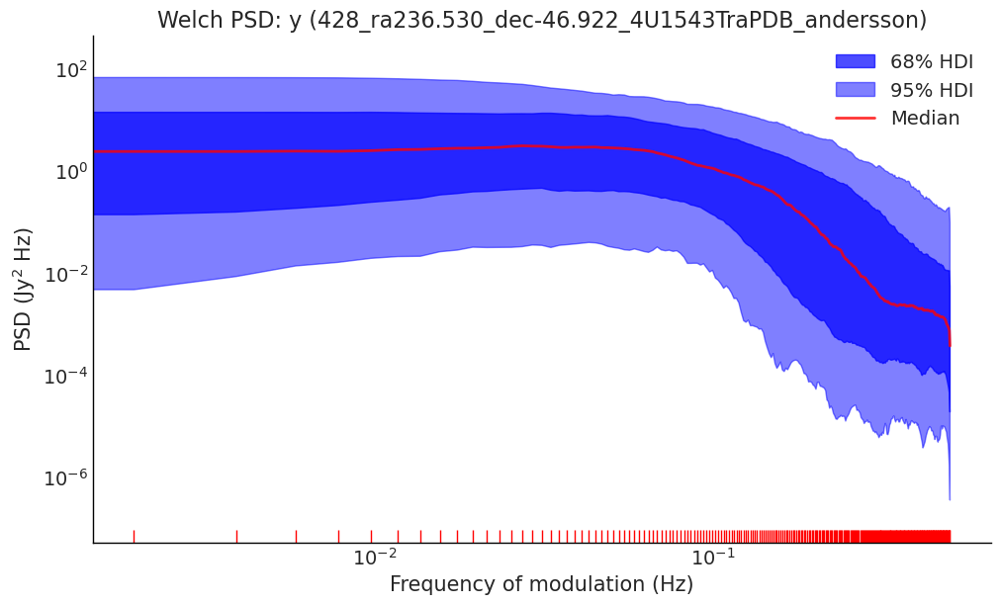

In [7]:
ufn.plot_welch_psd(se0_trace, group="prior_predictive", variable_name="y")
this_xlim = plt.xlim()

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


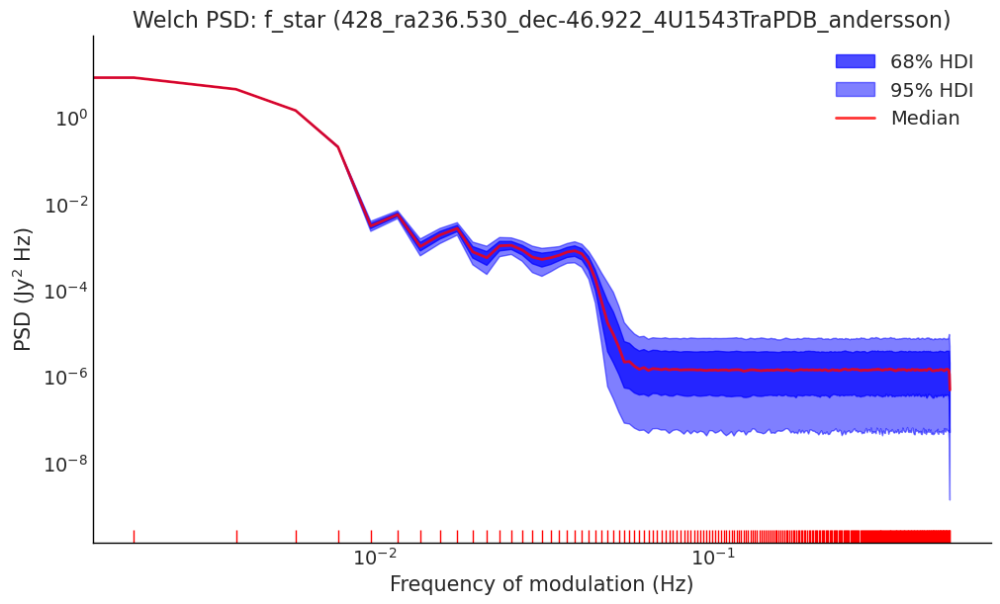

In [8]:
ufn.plot_welch_psd(se0_trace, group="posterior_predictive", variable_name="f_star")

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


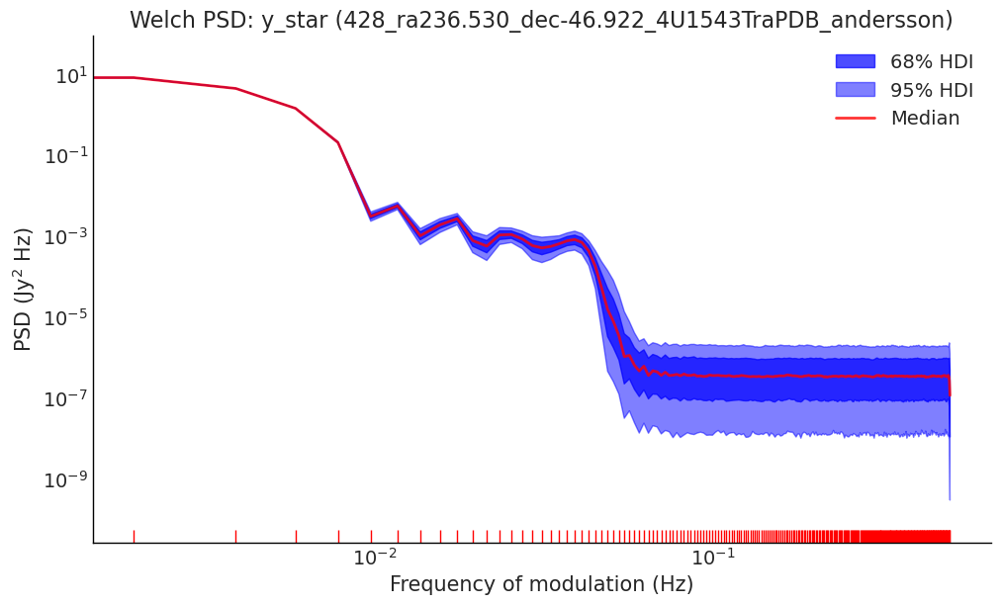

In [9]:
ufn.plot_welch_psd(se0_trace, group="posterior_predictive", variable_name="y_star")

(0.0014801919594828097, 0.6597539553864471)

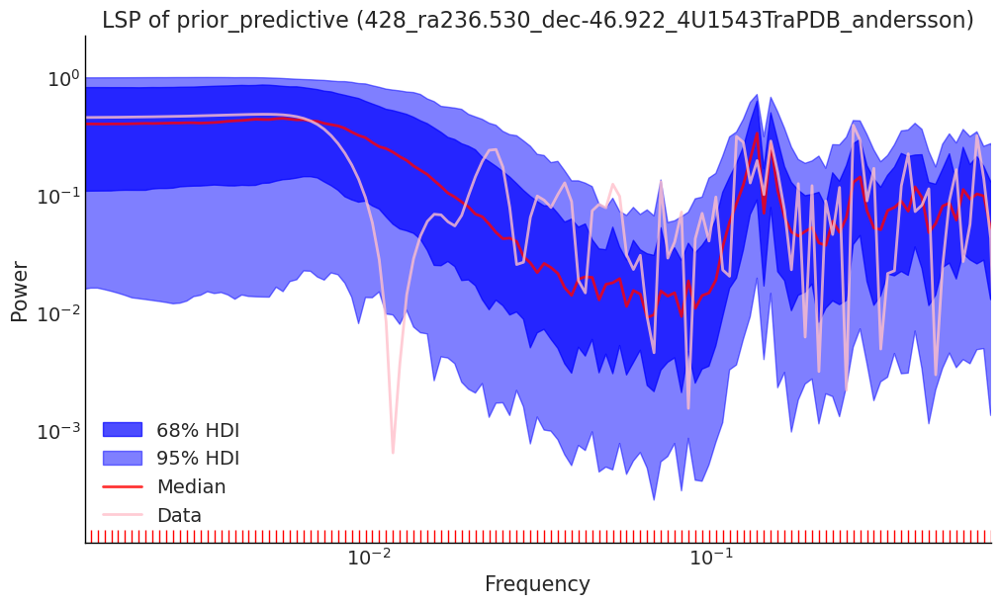

In [10]:
se0_priorpred_xr = ufn.plot_lsp(se0_trace, group="prior_predictive", variable_name="y")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

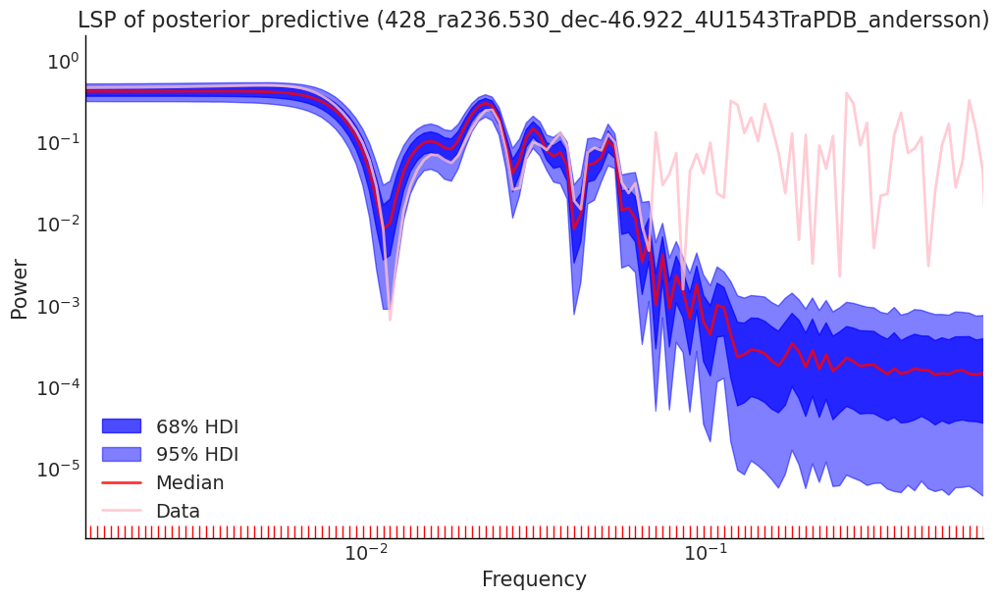

In [11]:
se0_postpred_xr = ufn.plot_lsp(se0_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

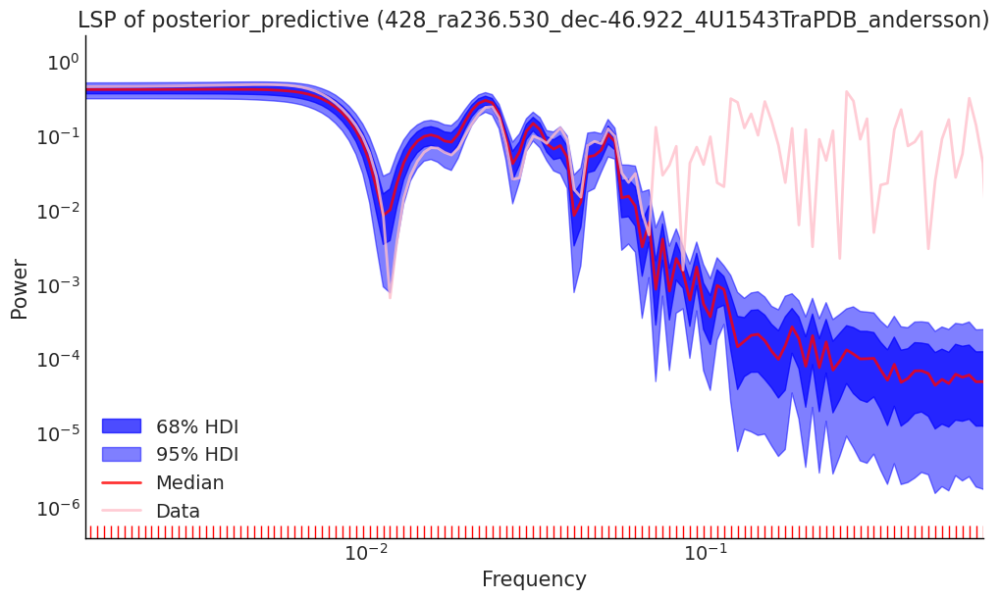

In [12]:
se0_postpred_xr = ufn.plot_lsp(se0_trace, "posterior_predictive", "y_star")
plt.xlim(this_xlim)

## Matern $\frac{3}{2}$ Kernel only

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{MVN}(\boldsymbol{0}, k_\textrm{M}(\tau))$$

$$k_\textrm{M}(\tau) =  \eta_\textrm{M}^2\left(1 + \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}}\right) \exp\left\{ - \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}} \right\}$$

$$\ell \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\textrm{stderr}(y)]\;, \;\textrm{SD}[\textrm{stderr}(y)]\;)$$

Sampling: [ell_M32, eta_M32, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta_M32, ell_M32, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 87 seconds.
Sampling: [f_star, y_star]


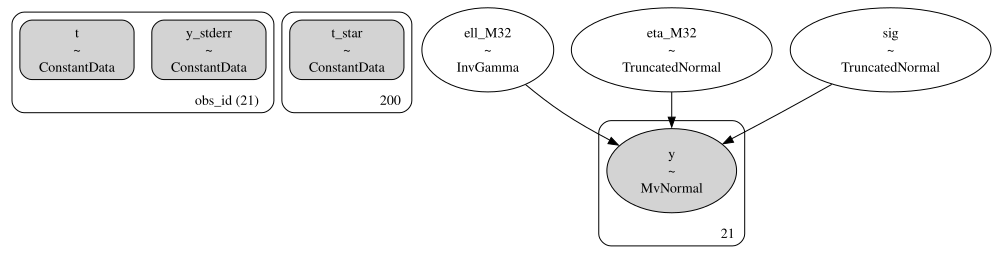

In [13]:
m32_trace_path = Path(f"traces/{csv_path.stem}_m32_idata.nc")
m32_dag_path = Path(f'dags/{csv_path.stem}_m32_dag.dot')

if m32_trace_path.is_file() and not OVERWRITE_TRACES:
    m32_trace = az.from_netcdf(m32_trace_path)
    m32_dag = gv.Source.from_file(m32_dag_path)
else:
    m32_trace, m32_dag = ufn.fit_m32_gp(csv_path, rng_seed=rng);
    az.to_netcdf(m32_trace, m32_trace_path)
    with open(m32_dag_path, 'w') as writehandle:
        writehandle.write(m32_dag.source)

gv.Source(m32_dag.source)

In [65]:
variable_names = ["ell_M32", "eta_M32", "sig"]
ufn.print_post_summary(m32_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_M32,105.681340,26.801949,75.556304,168.553221,1.421638,1393.040748,1125.736839,1.002972,121.670515,56.205221
eta_M32,0.048026,0.028856,0.019211,0.170735,0.001909,1391.191980,1134.619001,1.002418,0.116443,0.206769
sig,0.000490,0.000028,0.000450,0.000533,0.000001,2061.795032,1515.918749,1.001895,0.000492,0.000042


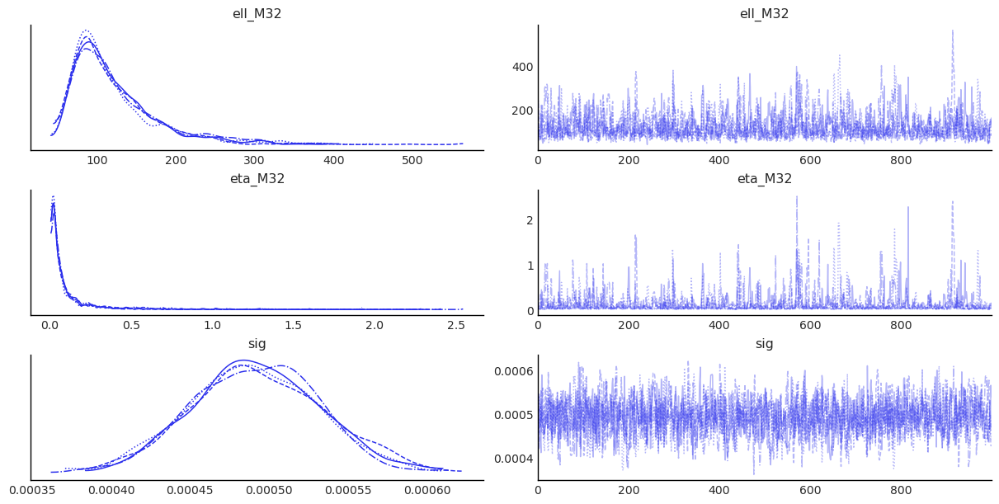

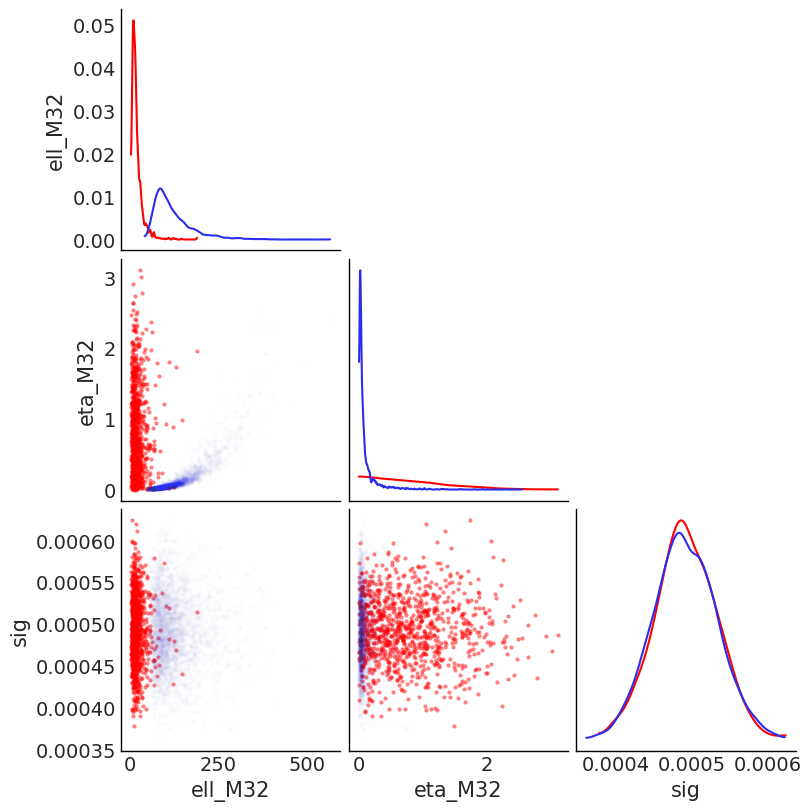

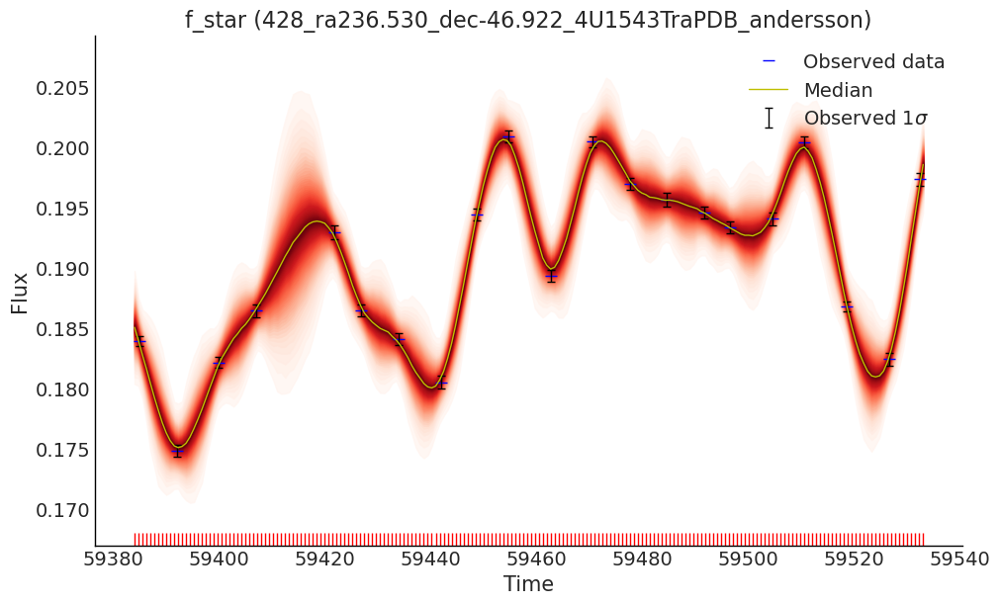

In [66]:
ufn.plot_traces(m32_trace, variable_names)
ufn.plot_priorpost_cnr(m32_trace, variable_names)
ufn.plot_postpred_samples(m32_trace)

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


(0.0014801919594828097, 0.6597539553864471)

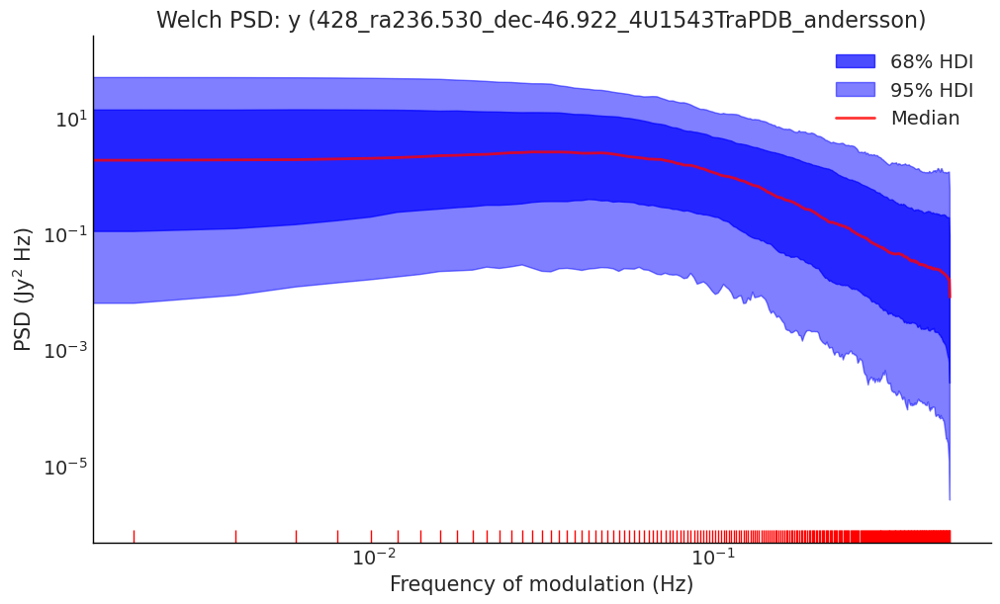

In [16]:
ufn.plot_welch_psd(m32_trace, "prior_predictive", "y")
plt.xlim(this_xlim)

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


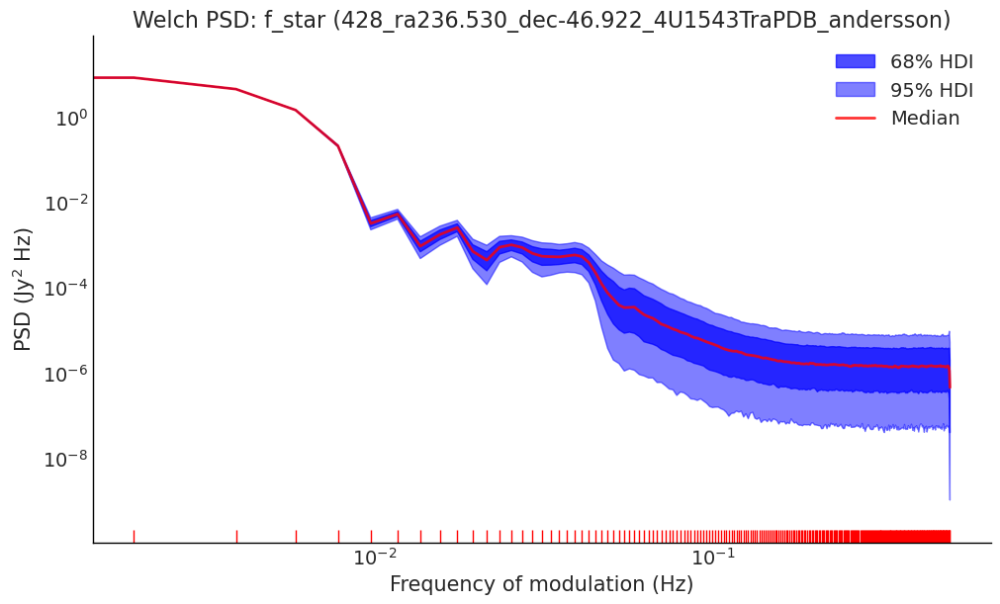

In [17]:
ufn.plot_welch_psd(m32_trace)

(0.0014801919594828097, 0.6597539553864471)

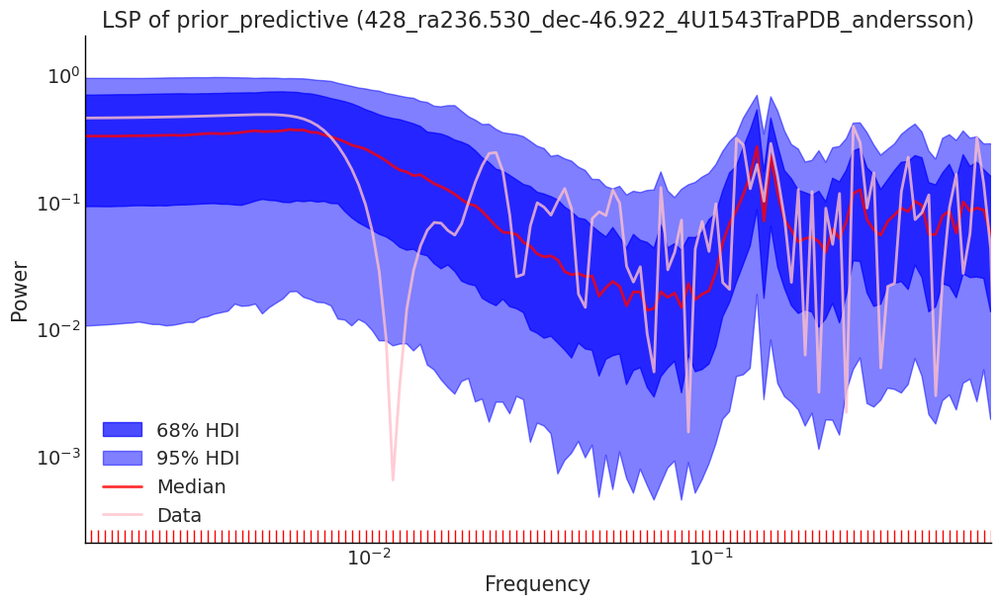

In [18]:
ufn.plot_lsp(m32_trace, "prior_predictive", "y")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

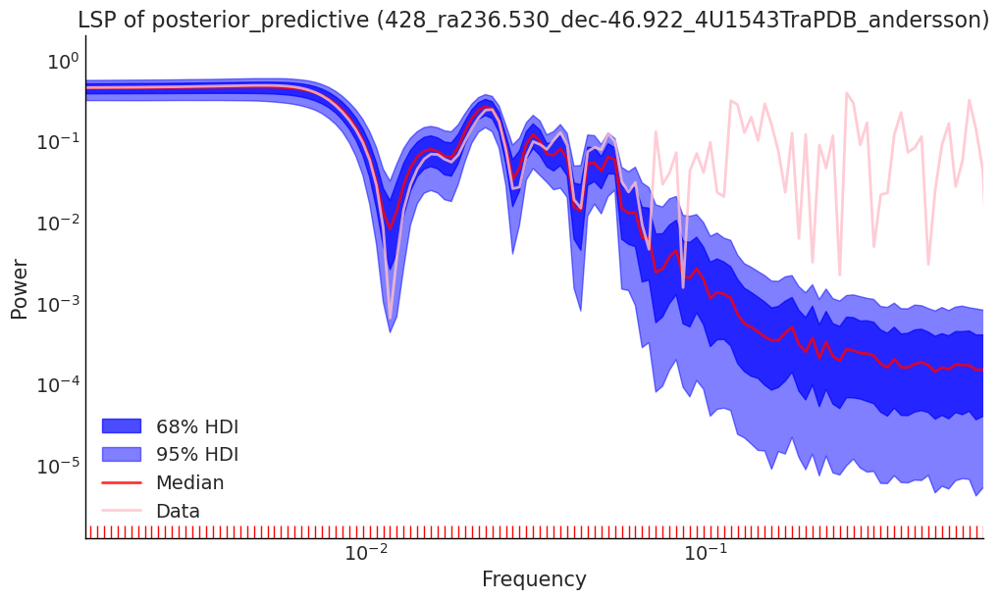

In [19]:
ufn.plot_lsp(m32_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

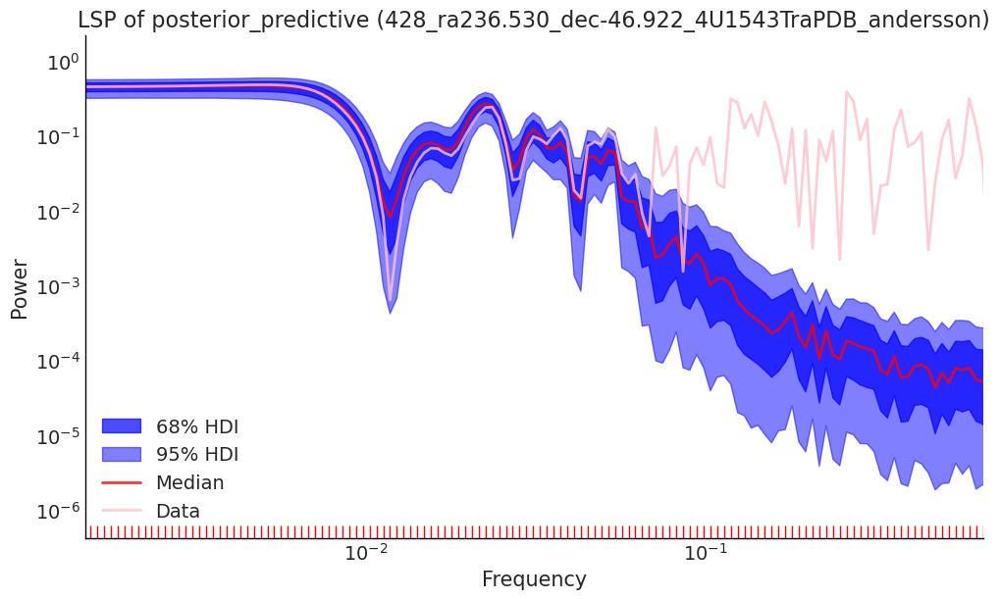

In [20]:
ufn.plot_lsp(m32_trace, "posterior_predictive", "y_star")
plt.xlim(this_xlim)

## SE + Matern $\frac{3}{2}$ additive kernel

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{MVN}(\boldsymbol{0}, k_\textrm{SE+M}(\tau))$$

$$k_\textrm{SE+M}(\tau) = \eta \left[ \exp\left\{ - \frac{1}{2\ell_\textrm{SE}^2}\tau^2\right\} + \left(1 + \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}}\right) \exp\left\{ - \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}} \right\} \right]$$

$$\ell_\textrm{SE} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\ell_\textrm{M} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\textrm{stderr}(y)]\;, \;\textrm{SD}[\textrm{stderr}(y)]\;)$$

Sampling: [ell_M32, ell_SE, eta, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta, ell_SE, ell_M32, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 100 seconds.
Sampling: [f_star, y_star]


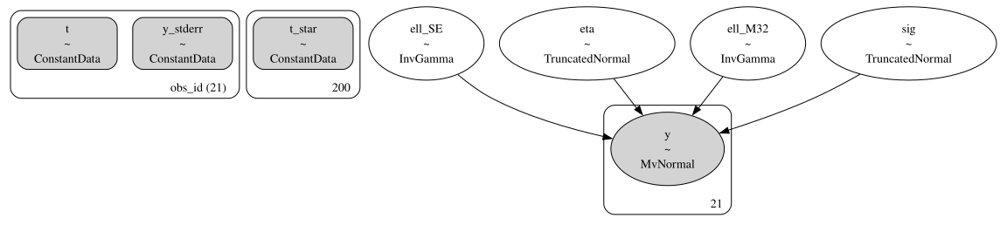

In [21]:
se_m32_trace_path = Path(f"traces/{csv_path.stem}_se+m32_idata.nc")
se_m32_dag_path = Path(f'dags/{csv_path.stem}_se+m32_dag.dot')

if se_m32_trace_path.is_file() and not OVERWRITE_TRACES:
    se_m32_trace = az.from_netcdf(se_m32_trace_path)
    se_m32_dag = gv.Source.from_file(se_m32_dag_path)
else:
    se_m32_trace, se_m32_dag = ufn.fit_se_m32_gp(csv_path, multiplicative_kernel=False, rng_seed=rng);
    az.to_netcdf(se_m32_trace, se_m32_trace_path)
    with open(se_m32_dag_path, 'w') as writehandle:
        writehandle.write(se_m32_dag.source)

gv.Source(se_m32_dag.source)

In [22]:
variable_names = ["ell_SE", "ell_M32", "eta", "sig"]
ufn.print_post_summary(se_m32_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,69.646322,23.899624,42.593854,128.133001,8.555893e-01,2423.772076,1225.319601,1.002657,88.875559,74.602750
ell_M32,69.886251,15.268144,51.638876,100.457519,8.044844e-01,1680.952181,1072.198103,1.003157,76.650812,30.067659
eta,0.015045,0.007820,0.007083,0.040829,4.324421e-04,1640.259580,1104.634633,1.003059,0.029389,0.050253
sig,0.000490,0.000028,0.000449,0.000531,8.613795e-07,3137.032244,1866.522674,0.999869,0.000490,0.000041


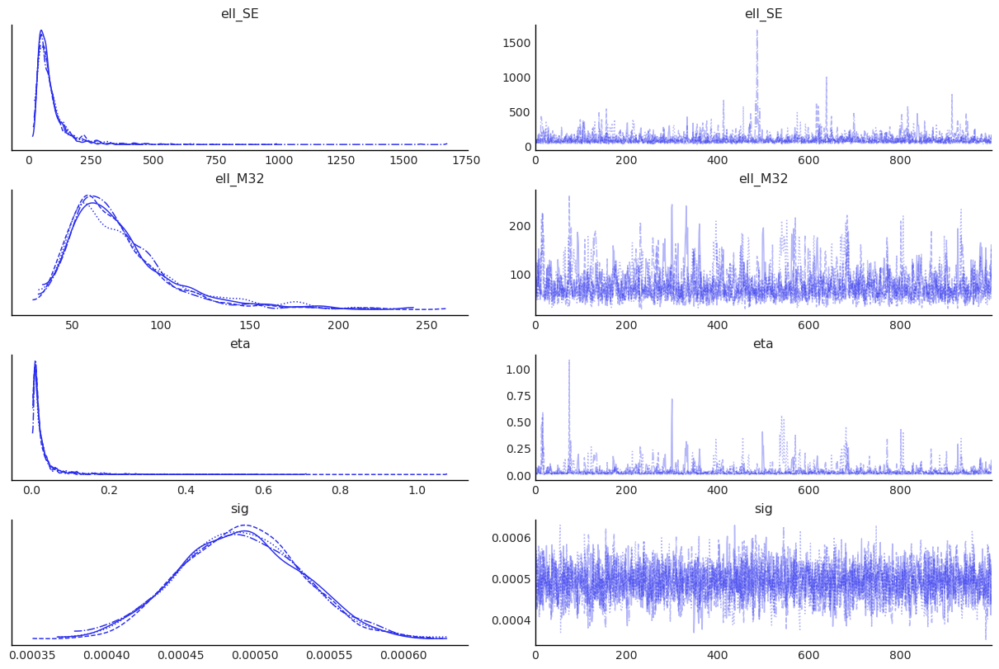

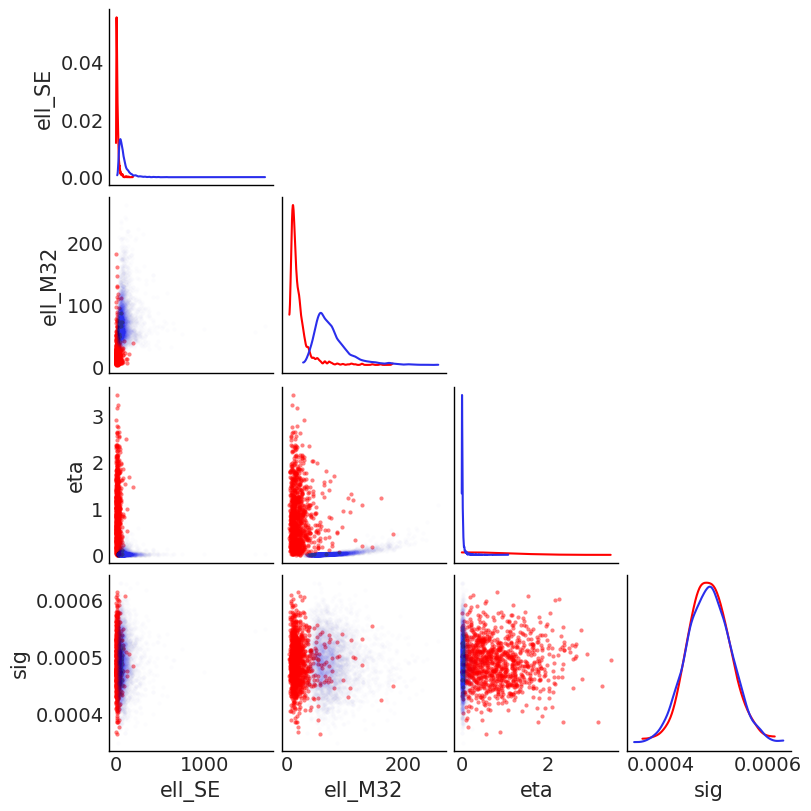

In [23]:
ufn.plot_traces(se_m32_trace, variable_names)
ufn.plot_priorpost_cnr(se_m32_trace, variable_names)

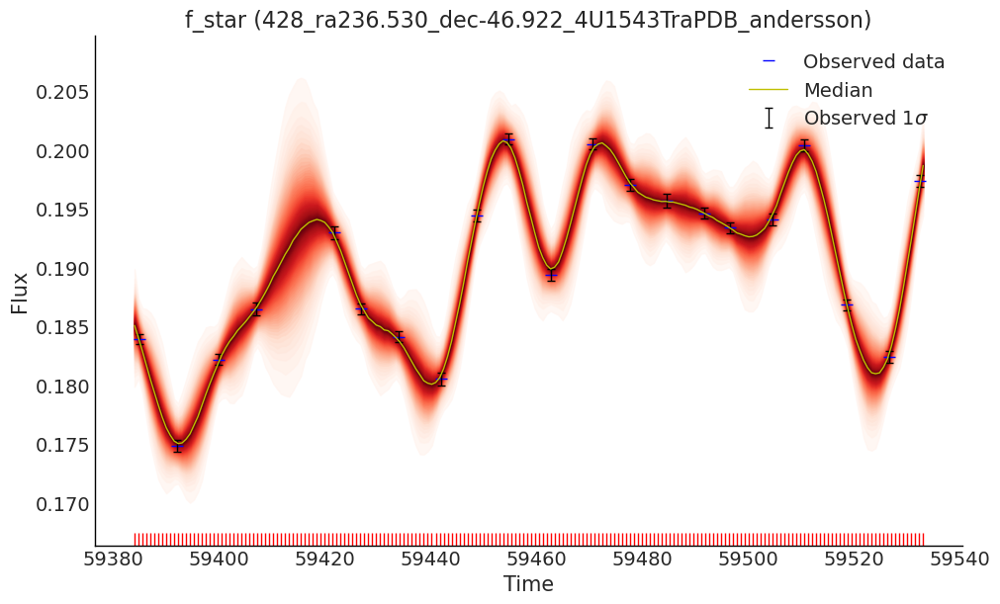

In [67]:
ufn.plot_postpred_samples(se_m32_trace)

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


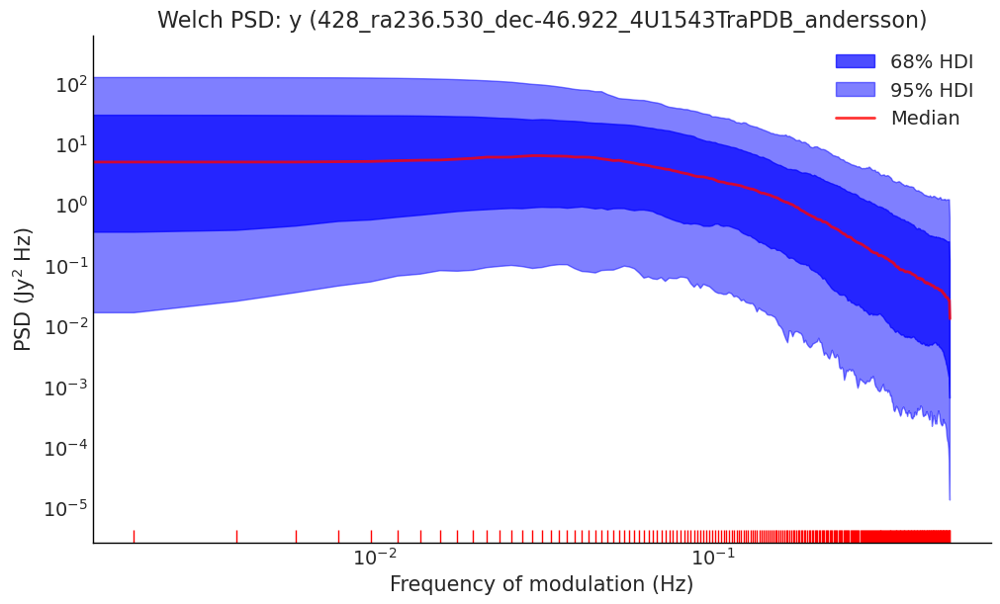

In [25]:
ufn.plot_welch_psd(se_m32_trace, "prior_predictive", "y")

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


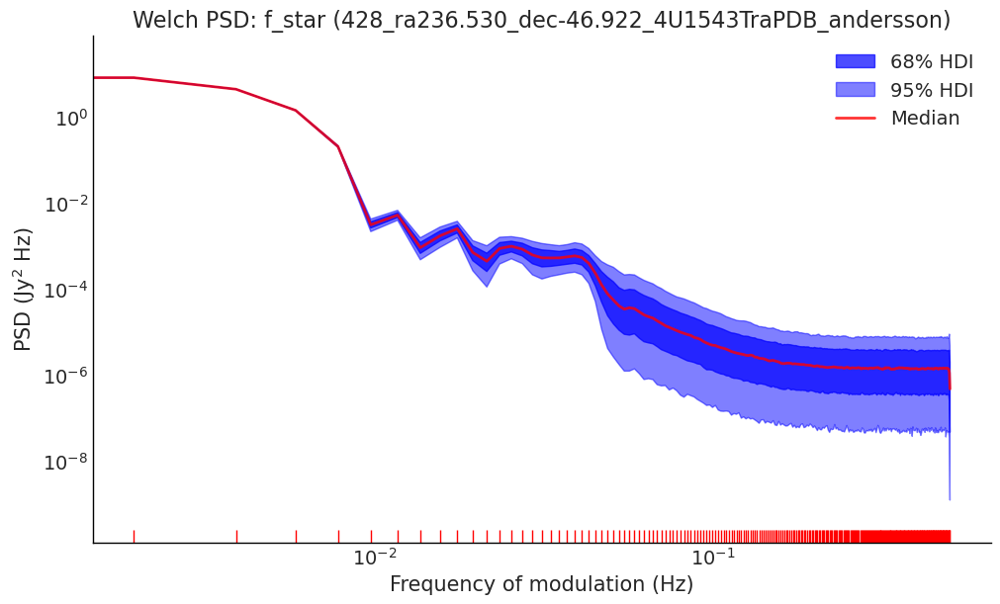

In [26]:
ufn.plot_welch_psd(se_m32_trace);

(0.0014801919594828097, 0.6597539553864471)

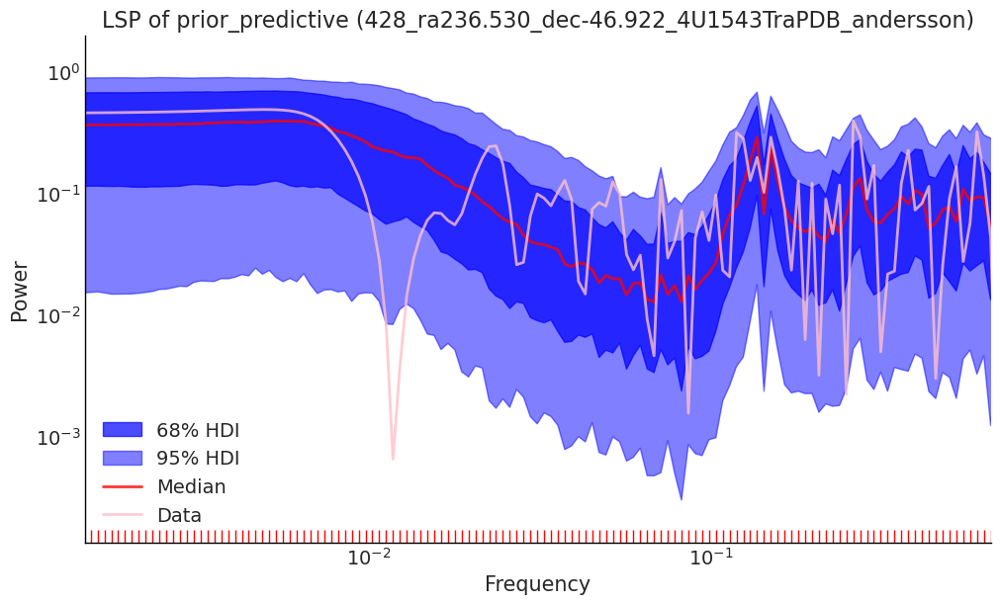

In [27]:
ufn.plot_lsp(se_m32_trace, "prior_predictive", "y")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

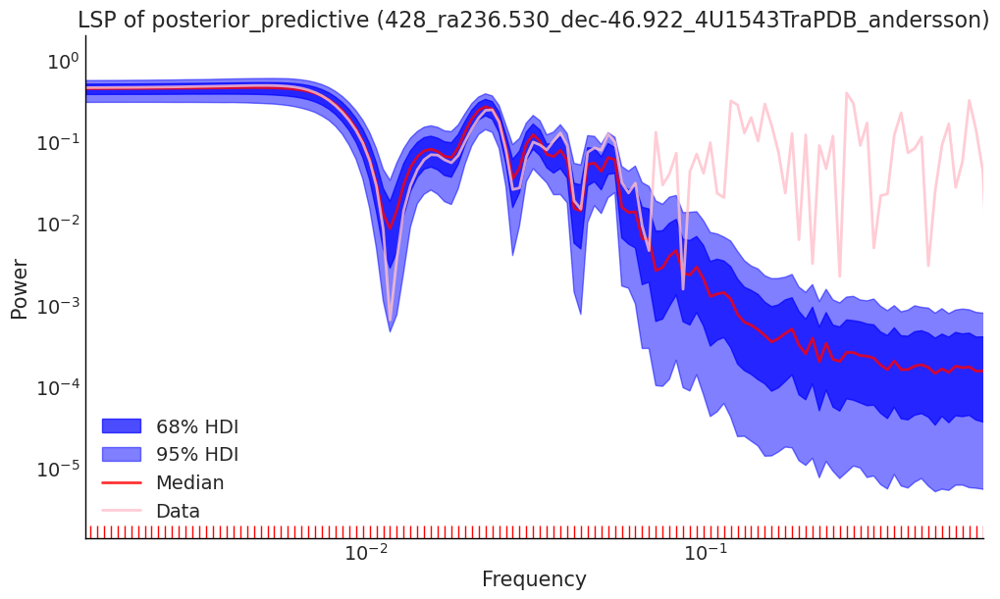

In [28]:
ufn.plot_lsp(se_m32_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

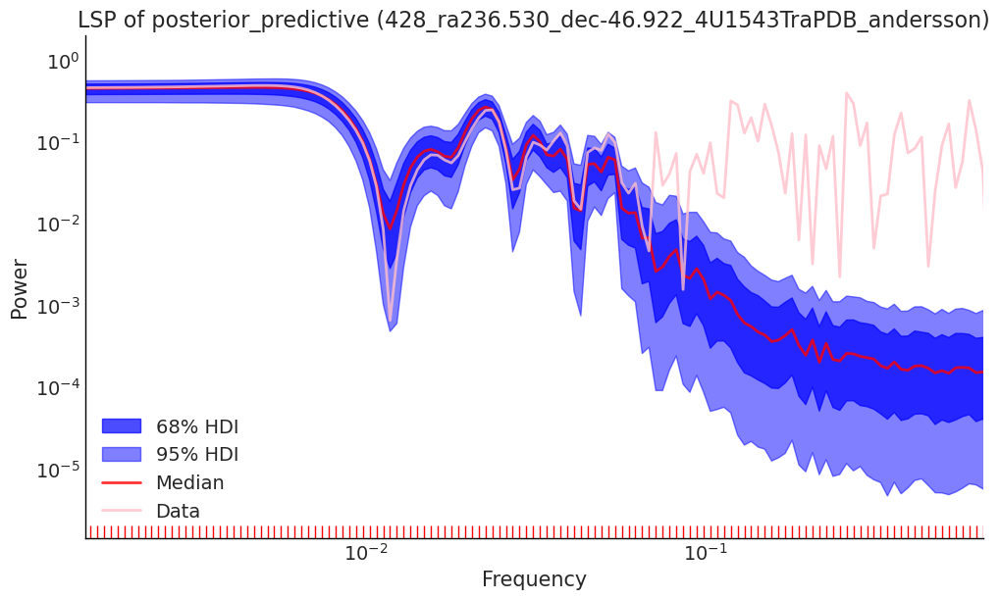

In [29]:
ufn.plot_lsp(se_m32_trace, "posterior_predictive", "y_star")
plt.xlim(this_xlim)

## SE $\times$ Matern $\frac{3}{2}$ Multiplicative Kernel

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{MVN}(\boldsymbol{0}, k_\textrm{SE+M}(\tau))$$

$$k_\textrm{SE+M}(\tau) = \eta \times \exp\left\{ - \frac{1}{2\ell_\textrm{SE}^2}\tau^2\right\} \times \left(1 + \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}}\right) \exp\left\{ - \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}} \right\}$$

$$\ell_\textrm{SE} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\ell_\textrm{M} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\textrm{stderr}(y)]\;, \;\textrm{SD}[\textrm{stderr}(y)]\;)$$

Sampling: [ell_M32, ell_SE, eta, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta, ell_SE, ell_M32, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 115 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [f_star, y_star]


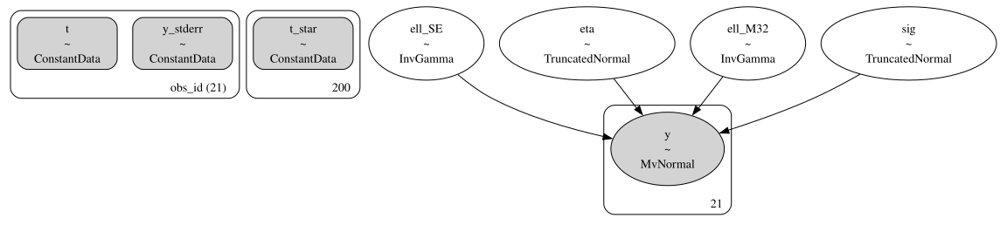

In [30]:
sexm32_trace_path = Path(f"traces/{csv_path.stem}_sexm32_idata.nc")
sexm32_dag_path = Path(f'dags/{csv_path.stem}_sexm32_dag.dot')

if sexm32_trace_path.is_file() and not OVERWRITE_TRACES:
    sexm32_trace = az.from_netcdf(sexm32_trace_path)
    sexm32_dag = gv.Source.from_file(sexm32_dag_path)
else:
    sexm32_trace, sexm32_dag = ufn.fit_se_m32_gp(csv_path, multiplicative_kernel=True, rng_seed=rng);
    az.to_netcdf(sexm32_trace, sexm32_trace_path)
    with open(sexm32_dag_path, 'w') as writehandle:
        writehandle.write(sexm32_dag.source)

gv.Source(sexm32_dag.source)

In [31]:
variable_names = ["ell_SE", "ell_M32", "eta", "sig"]
ufn.print_post_summary(sexm32_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,84.731999,28.618600,53.551310,153.393598,1.130584e+00,2613.488627,2081.797874,1.001430,106.994229,76.354862
ell_M32,94.382932,20.341270,69.832452,134.588237,9.517221e-01,1878.684932,1293.607391,1.003352,103.259046,38.793083
eta,0.035039,0.017898,0.016631,0.093538,8.845378e-04,1704.982251,1456.275149,1.003662,0.064642,0.105188
sig,0.000492,0.000027,0.000453,0.000532,9.797387e-07,2839.002387,2114.788754,1.001374,0.000492,0.000040


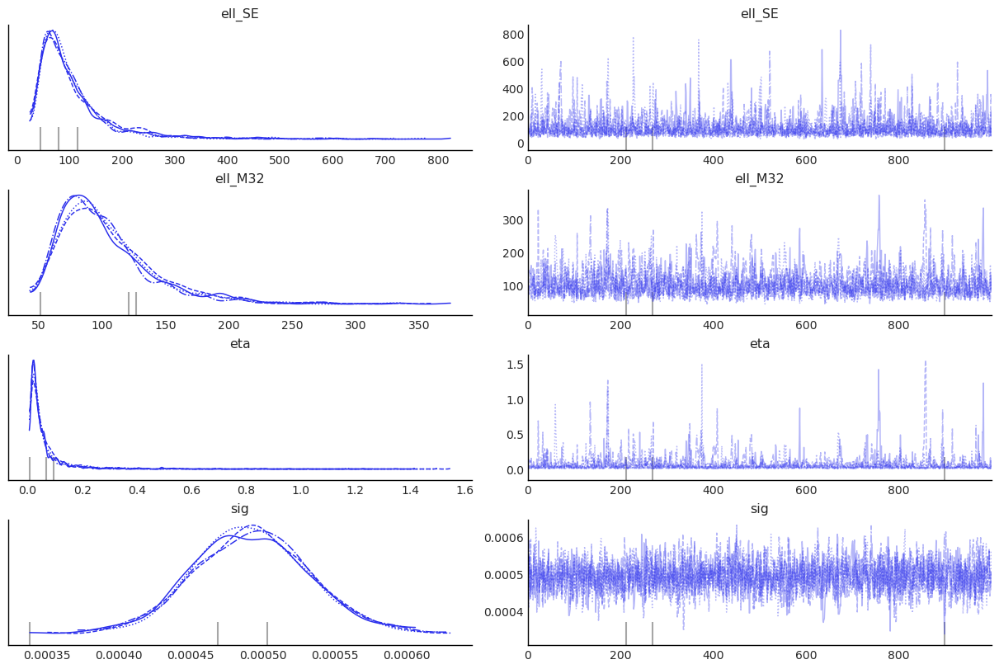

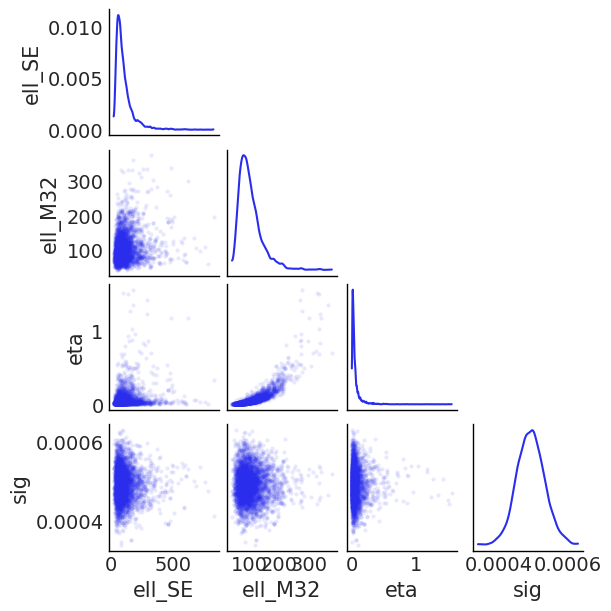

In [32]:
ufn.plot_traces(sexm32_trace, variable_names)
ufn.plot_post_cnr(sexm32_trace, variable_names)

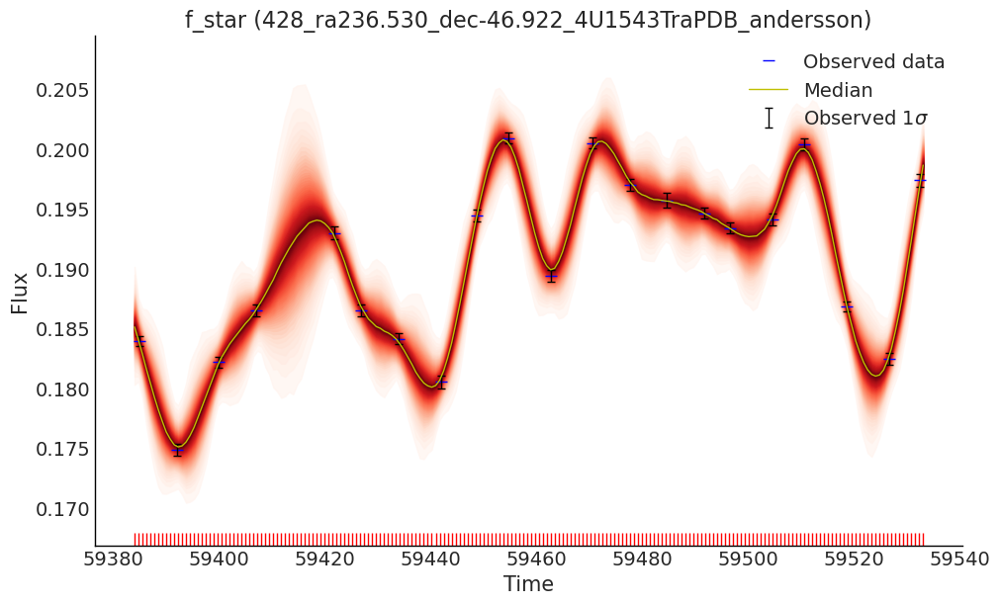

In [68]:
ufn.plot_postpred_samples(sexm32_trace)

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


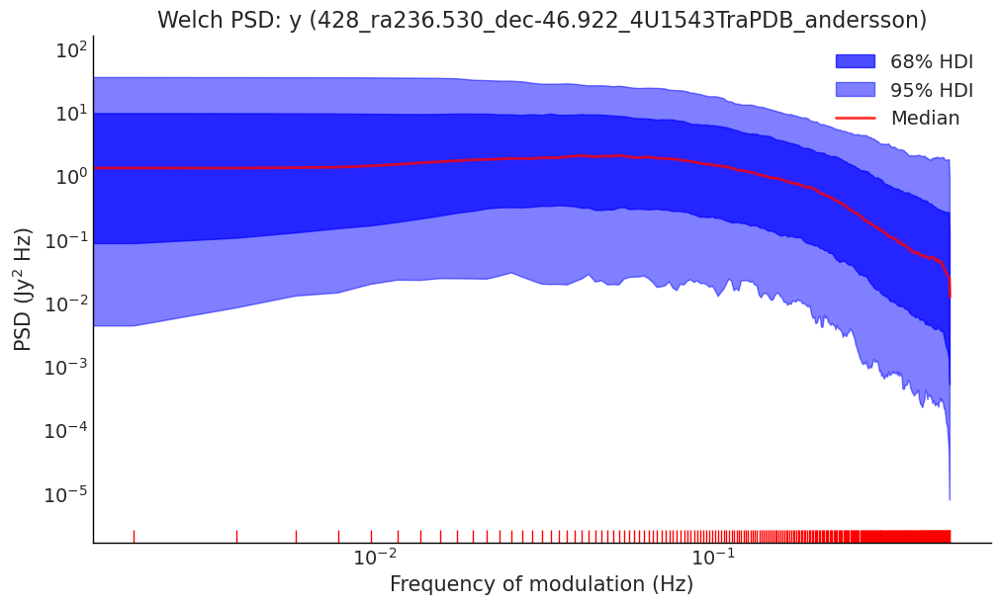

In [34]:
ufn.plot_welch_psd(sexm32_trace, "prior_predictive", "y")

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


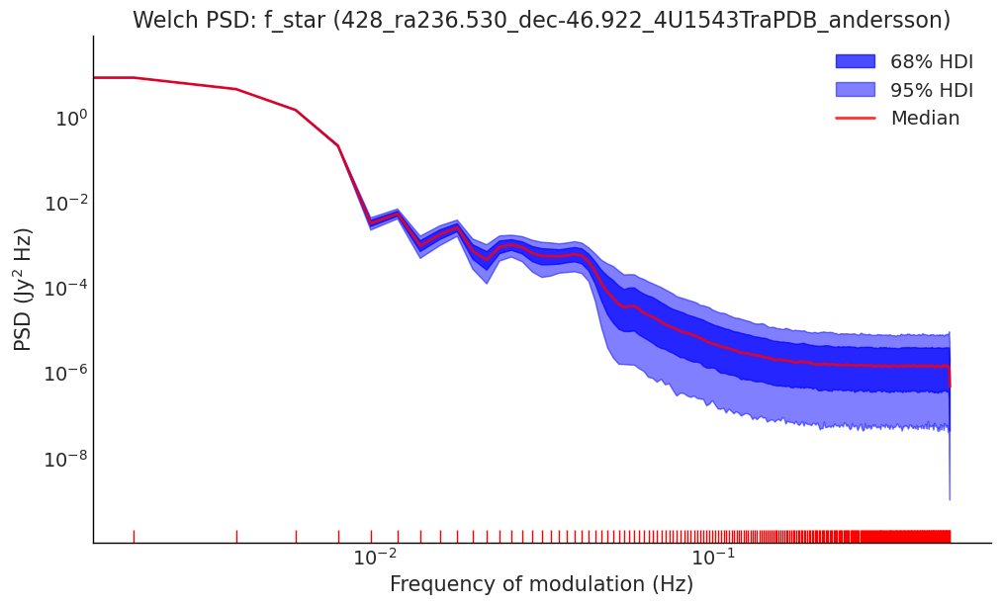

In [35]:
ufn.plot_welch_psd(sexm32_trace)

(0.0014801919594828097, 0.6597539553864471)

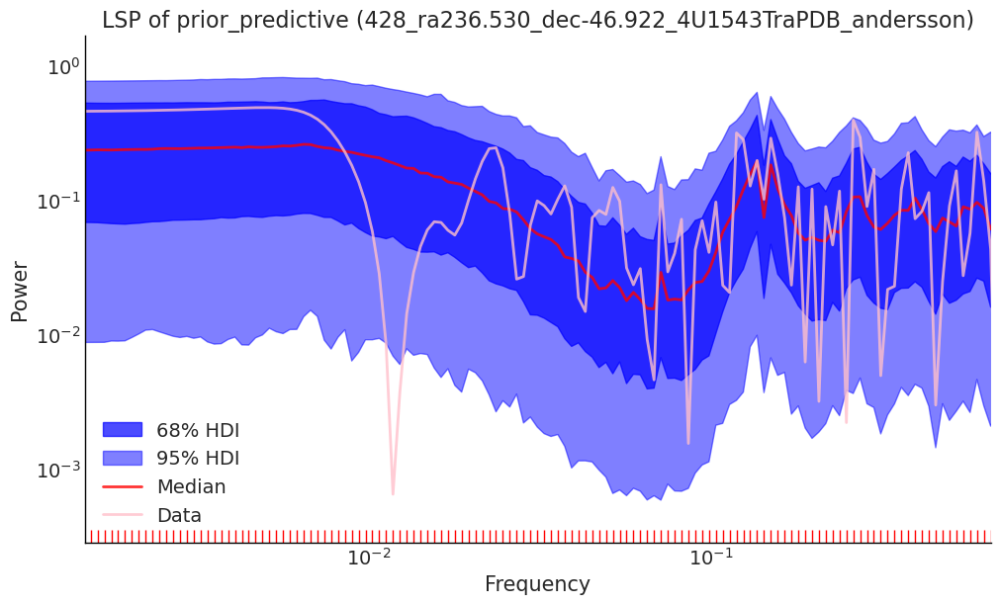

In [36]:
ufn.plot_lsp(sexm32_trace, "prior_predictive", "y")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

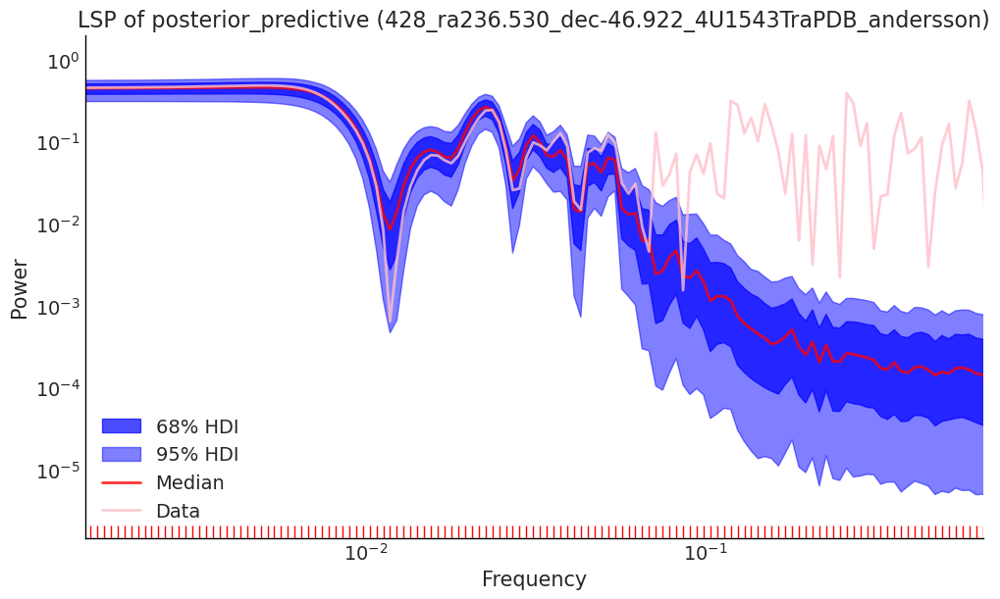

In [37]:
ufn.plot_lsp(sexm32_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

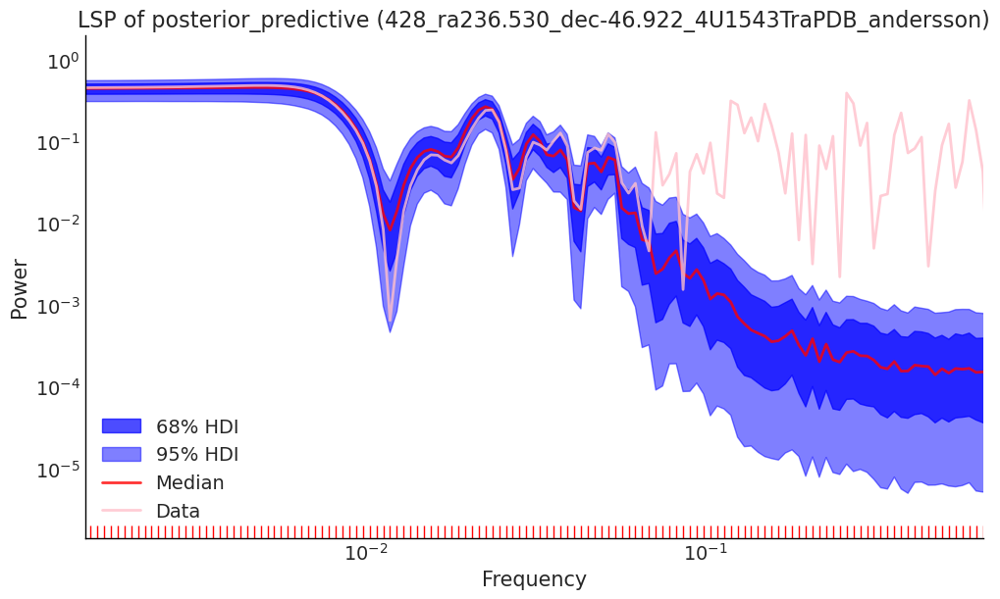

In [38]:
ufn.plot_lsp(sexm32_trace, "posterior_predictive", "y_star")
plt.xlim(this_xlim)

## SE GP + Matern $\frac{3}{2}$ GP

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{GP}(\boldsymbol{0}, k_\textrm{SE}(\tau)) + \mathcal{GP}(\boldsymbol{0}, k_\textrm{M}(\tau))$$

$$k_\textrm{SE}(\tau) = \eta_\textrm{SE}\exp\left\{ - \frac{1}{2\ell_\textrm{SE}^2}\tau^2\right\}, \quad k_\textrm{M}(\tau) = \eta_\textrm{M}\left(1 + \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}}\right) \exp\left\{ - \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}} \right\}$$

$$\ell_\textrm{SE} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\ell_\textrm{M} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta_\textrm{SE} \sim \mathcal{N}^+(0, 1)$$

$$\eta_\textrm{M} \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\textrm{stderr}(y)]\;, \;\textrm{SD}[\textrm{stderr}(y)]\;)$$

Sampling: [ell_M32, ell_SE, eta_M32, eta_SE, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta_SE, eta_M32, ell_SE, ell_M32, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 155 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 71 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [f_star, f_star_M32, f_star_SE, y_star]


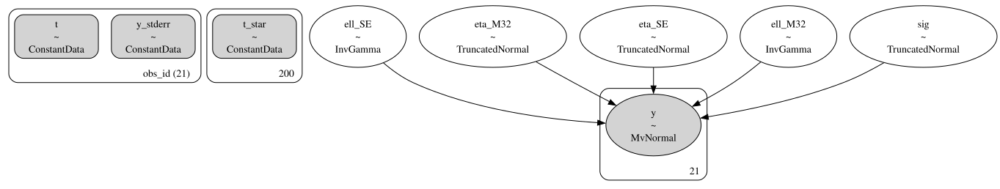

In [39]:
gpSE_gpM32_trace_path = Path(f"traces/{csv_path.stem}_gpSE_gpM32_idata.nc")
gpSE_gpM32_dag_path = Path(f'dags/{csv_path.stem}_gpSE_gpM32_dag.dot')

if gpSE_gpM32_trace_path.is_file() and not OVERWRITE_TRACES:
    gpSE_gpM32_trace = az.from_netcdf(gpSE_gpM32_trace_path)
    gpSE_gpM32_dag = gv.Source.from_file(gpSE_gpM32_dag_path)
else:
    gpSE_gpM32_trace, gpSE_gpM32_dag = ufn.fit_gpSE_gpM32(csv_path, rng_seed=rng);
    az.to_netcdf(gpSE_gpM32_trace, gpSE_gpM32_trace_path)
    with open(gpSE_gpM32_dag_path, 'w') as writehandle:
        writehandle.write(gpSE_gpM32_dag.source)

gv.Source(gpSE_gpM32_dag.source)

In [40]:
variable_names = ["ell_SE", "ell_M32", "eta_SE", "eta_M32", "sig"]
ufn.print_post_summary(gpSE_gpM32_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,160.202376,138.131826,7.047445,391.067219,61.274591,11.219782,30.338140,1.551772,229.070321,326.687238
ell_M32,13.817580,6.901785,7.515410,377.012199,6.635512,11.397500,29.327893,1.533457,202.215267,550.100273
eta_SE,0.043639,0.043542,0.000110,0.255398,0.031358,11.650769,29.452763,1.531886,0.140616,0.257354
eta_M32,0.000209,0.000158,0.000066,0.034594,0.000325,11.218517,43.425088,1.431246,0.030319,0.110134
sig,0.000490,0.000027,0.000452,0.000530,0.000001,1463.976301,1400.559328,1.003697,0.000491,0.000040


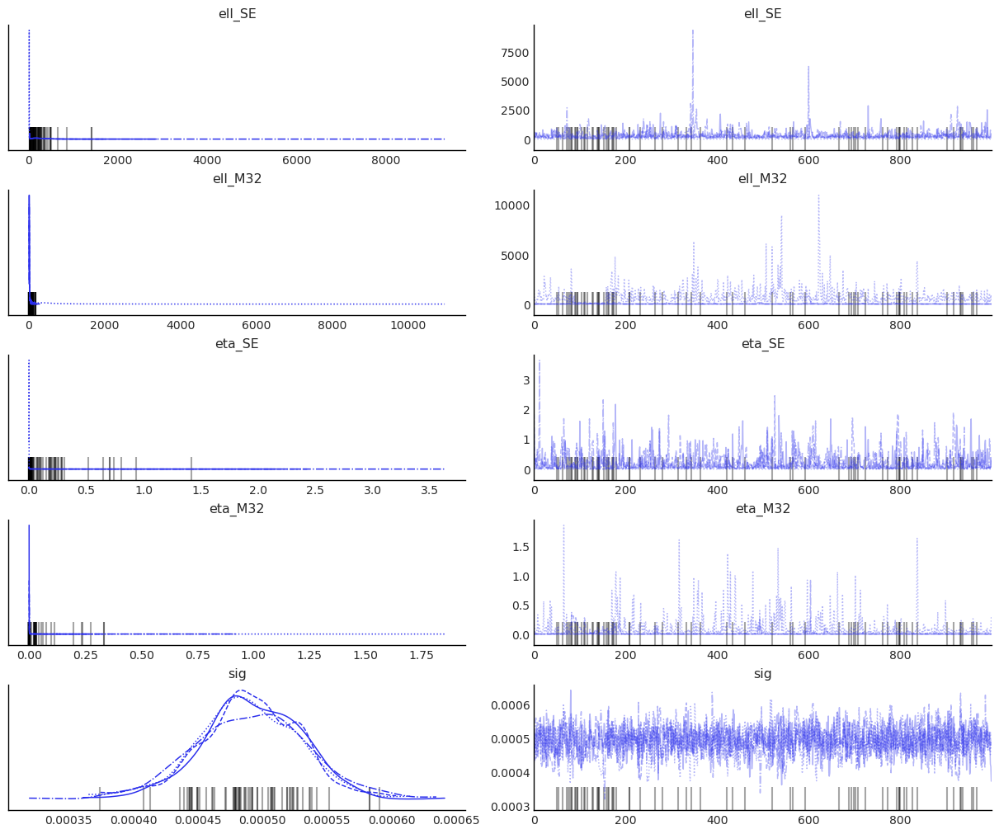

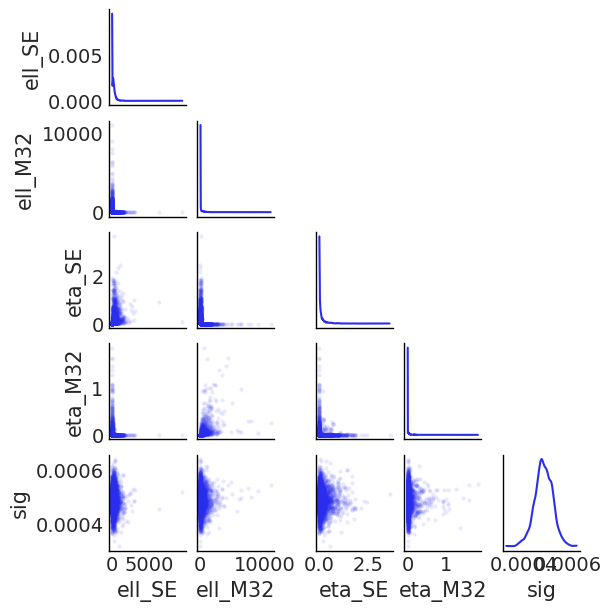

In [41]:
ufn.plot_traces(gpSE_gpM32_trace, variable_names)
ufn.plot_post_cnr(gpSE_gpM32_trace, variable_names)

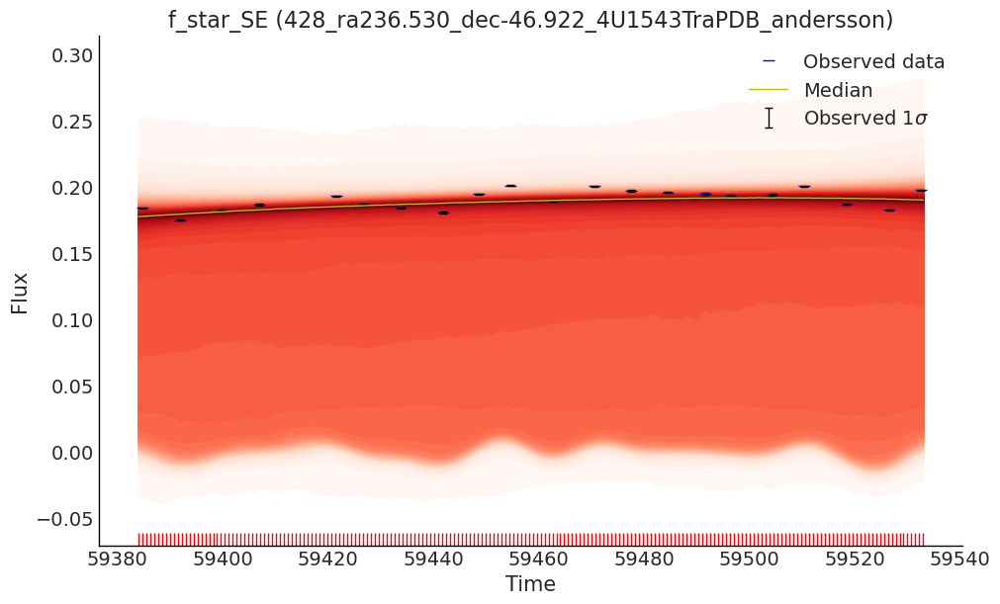

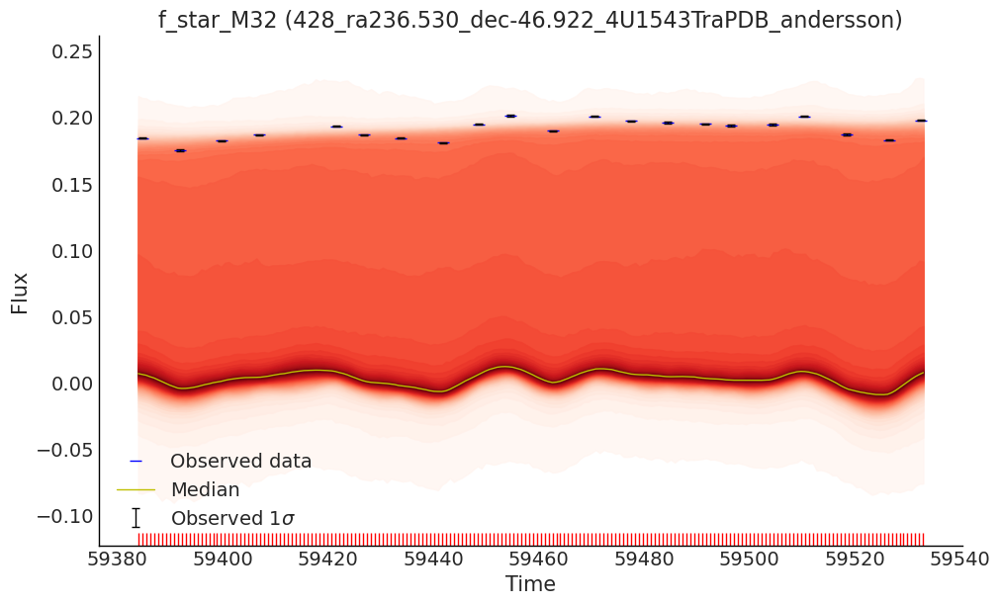

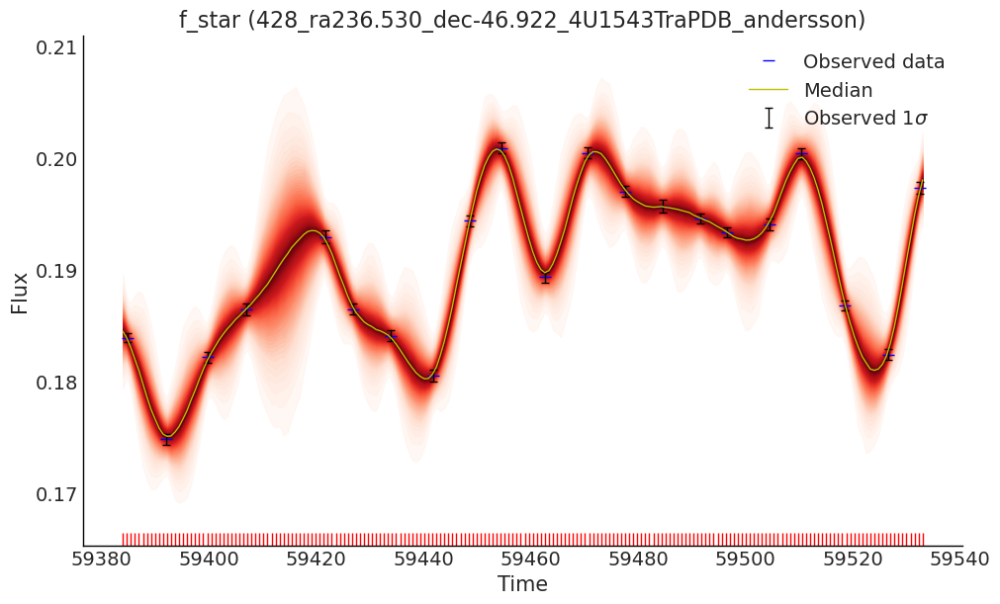

In [69]:
ufn.plot_postpred_samples(gpSE_gpM32_trace, "f_star_SE")
ufn.plot_postpred_samples(gpSE_gpM32_trace, "f_star_M32")
ufn.plot_postpred_samples(gpSE_gpM32_trace, "f_star")

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


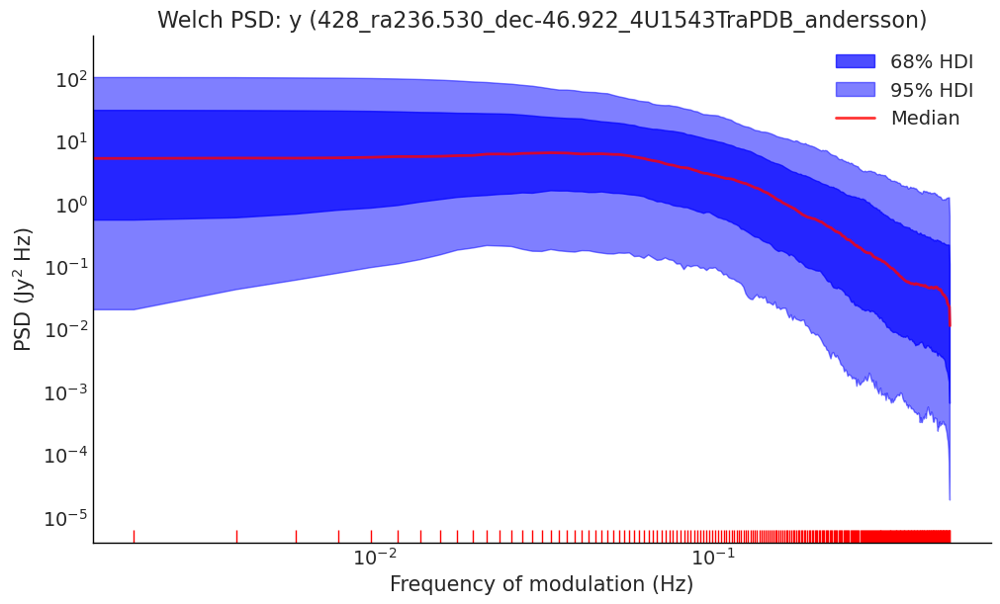

In [43]:
ufn.plot_welch_psd(gpSE_gpM32_trace, group="prior_predictive", variable_name="y")
this_xlim = plt.xlim()

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


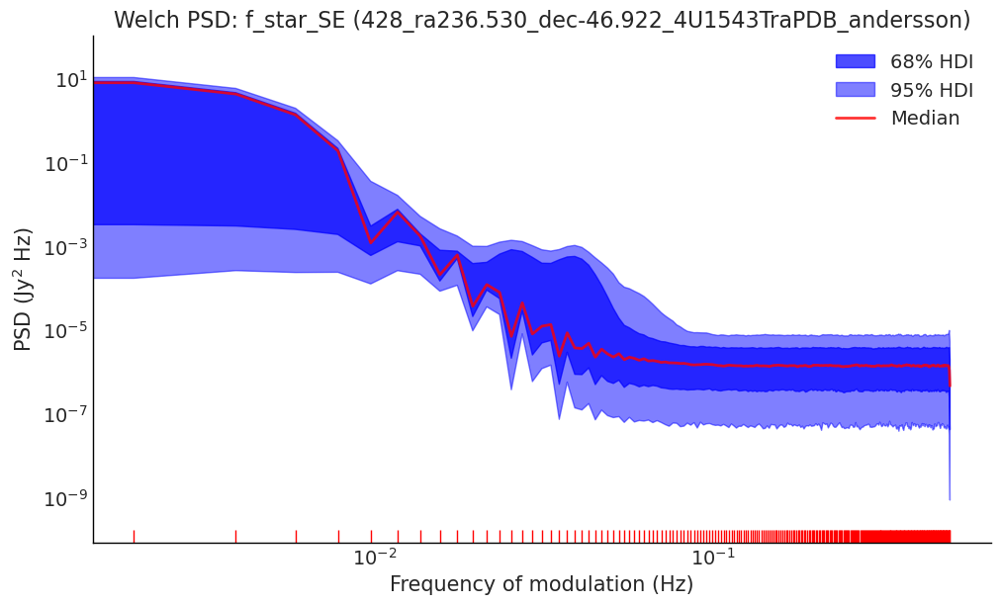

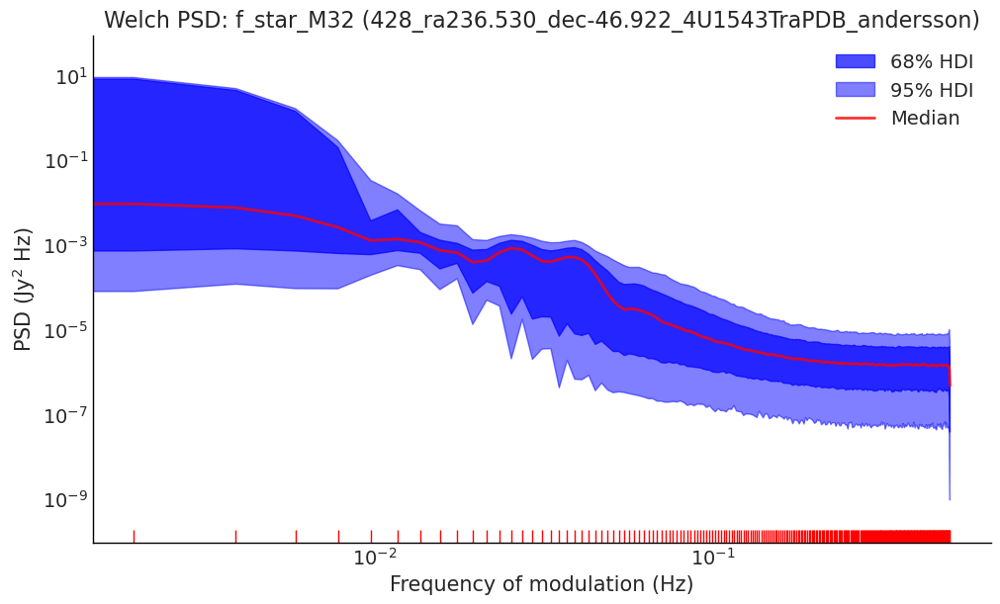

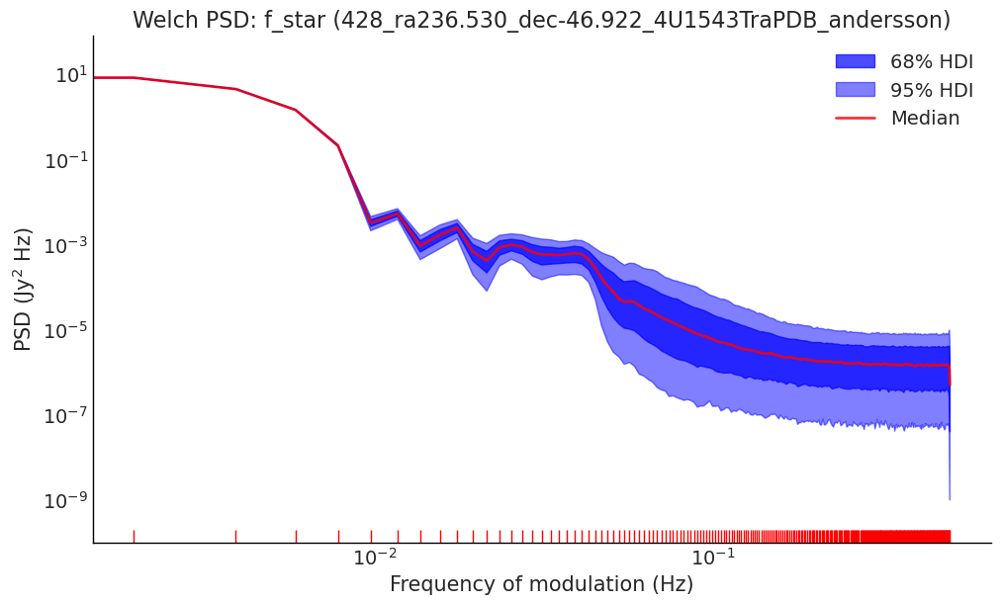

In [44]:
ufn.plot_welch_psd(gpSE_gpM32_trace, group="posterior_predictive", variable_name="f_star_SE")
ufn.plot_welch_psd(gpSE_gpM32_trace, variable_name="f_star_M32")
ufn.plot_welch_psd(gpSE_gpM32_trace, variable_name="f_star")

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


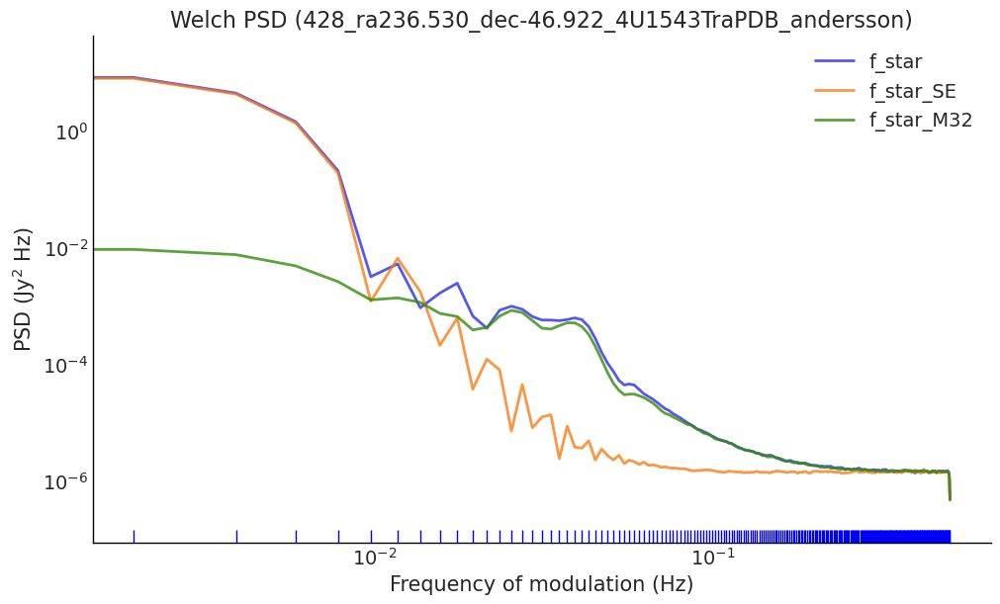

In [45]:
ufn.plot_welch_psds(gpSE_gpM32_trace)

(0.0014801919594828097, 0.6597539553864471)

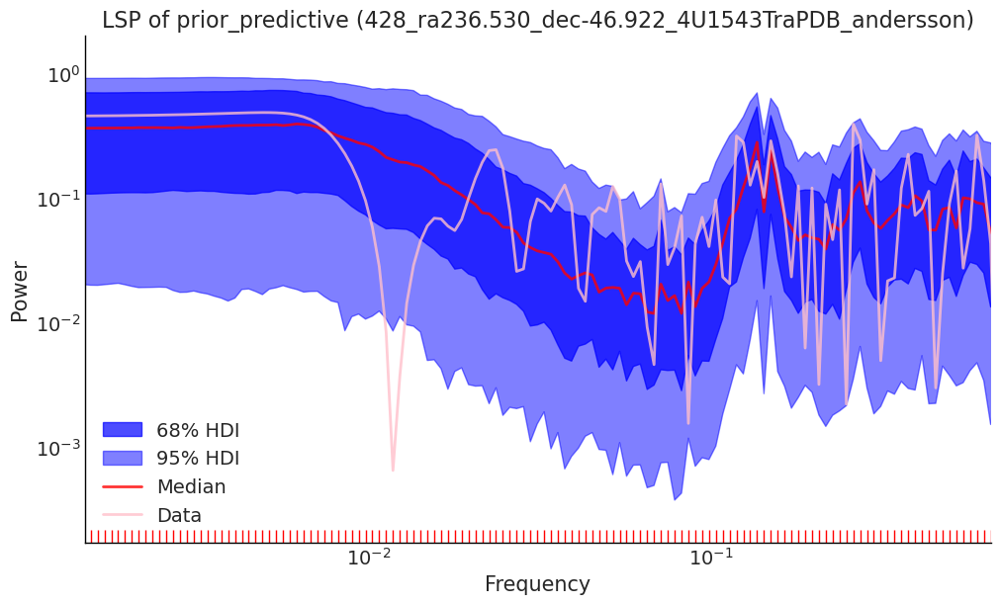

In [46]:
ufn.plot_lsp(gpSE_gpM32_trace, group="prior_predictive", variable_name="y")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

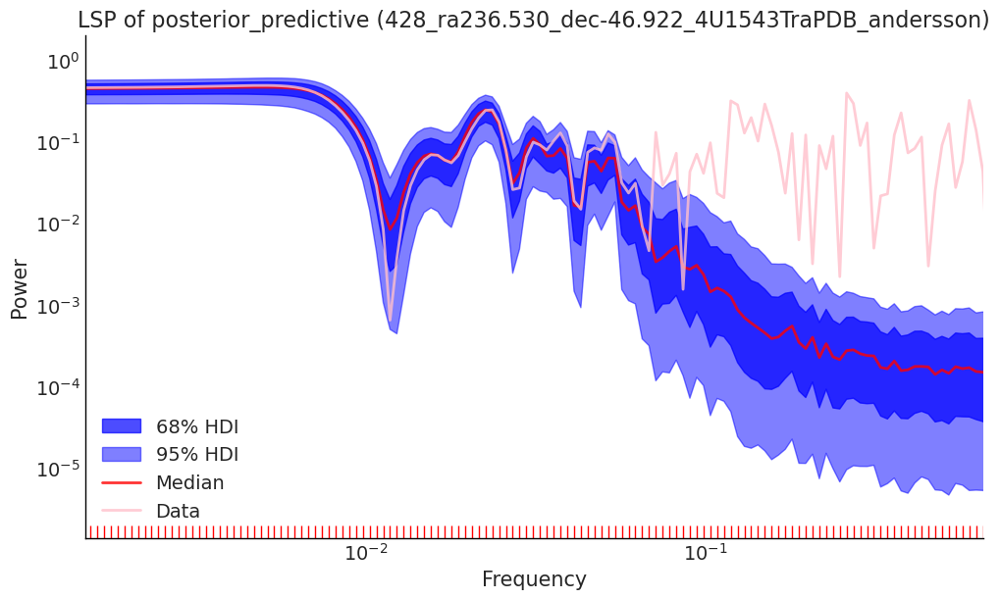

In [47]:
ufn.plot_lsp(gpSE_gpM32_trace, group="posterior_predictive", variable_name="f_star")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

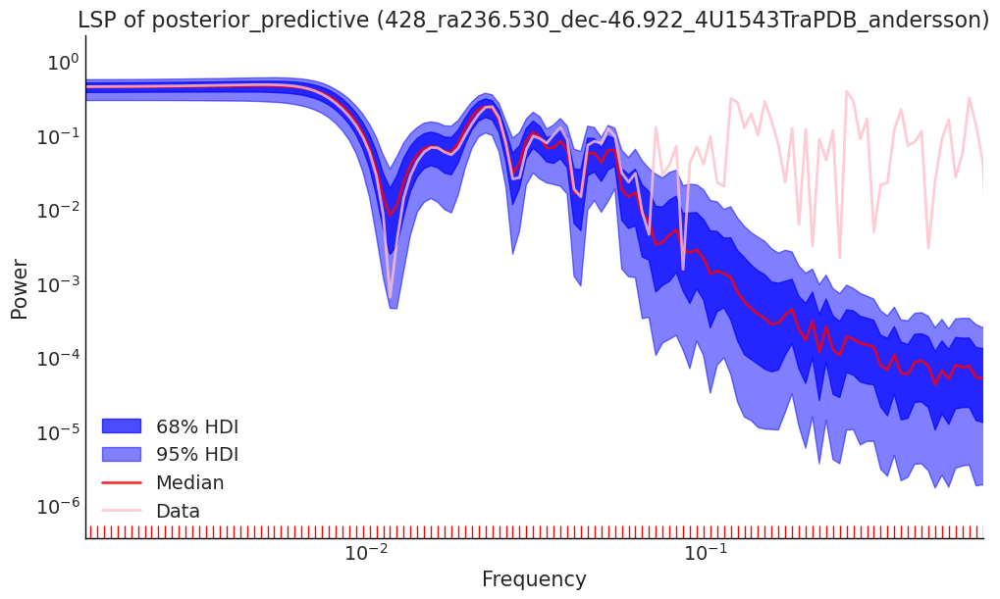

In [48]:
ufn.plot_lsp(gpSE_gpM32_trace, group="posterior_predictive", variable_name="y_star")
plt.xlim(this_xlim)

## SE GP + Periodic GP

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{GP}(\boldsymbol{0}, k_\textrm{SE}(\tau)) + \mathcal{GP}(\boldsymbol{0}, k_\textrm{P}(\tau))$$

$$k_\textrm{SE}(\tau) = \eta_\textrm{SE}\exp\left\{ - \frac{1}{2\ell_\textrm{SE}^2}\tau^2\right\}, \quad k_\textrm{P}(\tau) = \eta_\textrm{P} \exp \left\{ -\frac{1}{2\ell^2_\textrm{P}}\sin^2 \left(\pi\frac{\tau}{T}\right)\right\}$$

$$\ell_\textrm{SE} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\ell_\textrm{P} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta_\textrm{SE} \sim \mathcal{N}^+(0, 1)$$

$$\eta_\textrm{P} \sim \mathcal{N}^+(0, 1)$$

$$T \sim \mathcal{U}[\textrm{min gap t} \times 4, \textrm{range t}/4]$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\textrm{stderr}(y)]\;, \;\textrm{SD}[\textrm{stderr}(y)]\;)$$

Sampling: [T, ell_Per, ell_SE, eta_Per, eta_SE, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta_SE, eta_Per, ell_SE, ell_Per, T, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 140 seconds.
Sampling: [f_star, f_star_Per, f_star_SE, y_star]


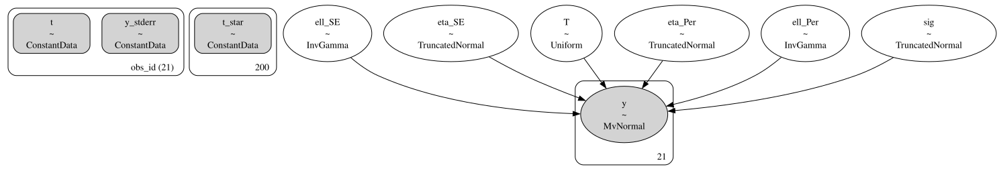

In [49]:
gpSE_gpPer_trace_path = Path(f"traces/{csv_path.stem}_gpSE_gpPer_idata.nc")
gpSE_gpPer_dag_path = Path(f'dags/{csv_path.stem}_gpSE_gpPer_dag.dot')

if gpSE_gpPer_trace_path.is_file() and not OVERWRITE_TRACES:
    gpSE_gpPer_trace = az.from_netcdf(gpSE_gpPer_trace_path)
    gpSE_gpPer_dag = gv.Source.from_file(gpSE_gpPer_dag_path)
else:
    gpSE_gpPer_trace, gpSE_gpPer_dag = ufn.fit_gpSE_gpPer(csv_path, rng_seed=rng);
    az.to_netcdf(gpSE_gpPer_trace, gpSE_gpPer_trace_path)
    with open(gpSE_gpPer_dag_path, 'w') as writehandle:
        writehandle.write(gpSE_gpPer_dag.source)

gv.Source(gpSE_gpPer_dag.source)

In [50]:
variable_names = ["ell_SE", "ell_Per", "eta_SE", "eta_Per", "T", "sig"]
ufn.print_post_summary(gpSE_gpPer_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,6.584126,0.617216,5.664468,7.512724,2.015969e-02,2676.838429,1905.803458,1.000398,6.586001,0.950648
ell_Per,27.814202,11.867630,14.685196,57.920952,4.560362e-01,2752.051830,2104.966324,1.000209,38.998512,40.677373
eta_SE,0.000084,0.000025,0.000055,0.000138,9.714197e-07,2620.156194,2183.403017,1.002326,0.000100,0.000064
eta_Per,0.118269,0.089314,0.030874,0.457891,5.422513e-03,2345.942525,3120.135059,1.001111,0.242184,0.318905
T,29.192659,3.491908,22.617915,33.755425,1.528538e-01,2061.393165,2081.924159,1.000211,28.734648,4.653450
sig,0.000491,0.000026,0.000453,0.000530,7.797698e-07,3159.681879,2225.362312,1.002437,0.000491,0.000040


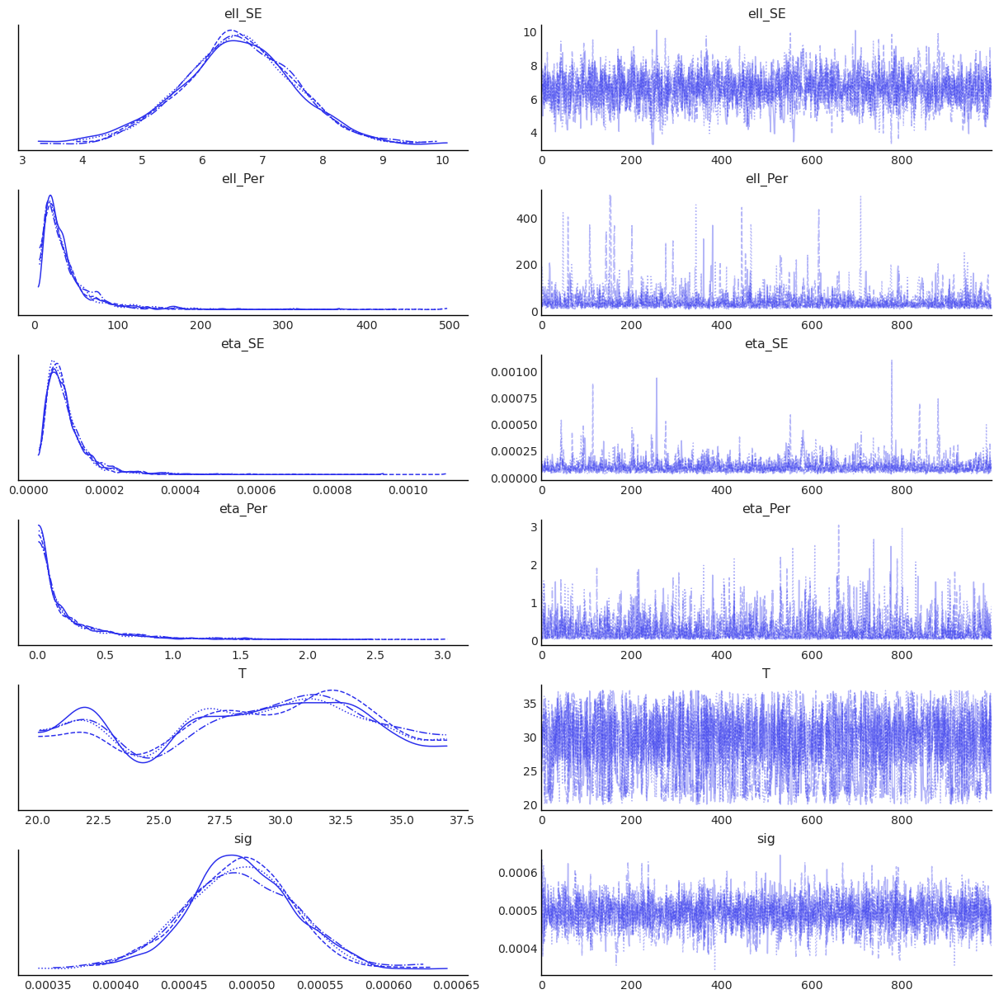

In [51]:
ufn.plot_traces(gpSE_gpPer_trace, variable_names);

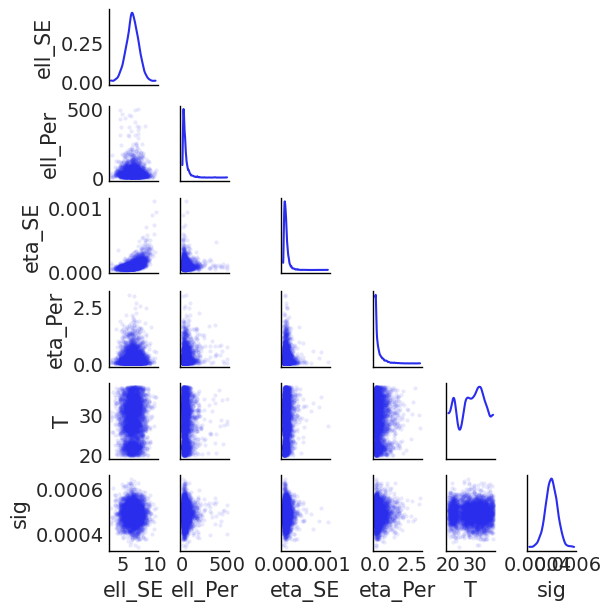

In [52]:
ufn.plot_post_cnr(gpSE_gpPer_trace, variable_names)

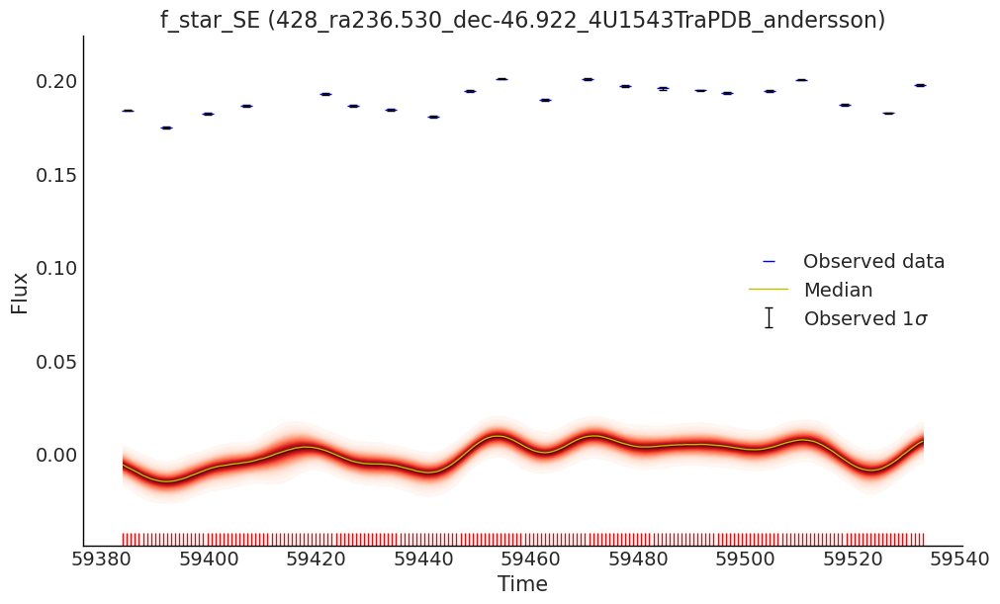

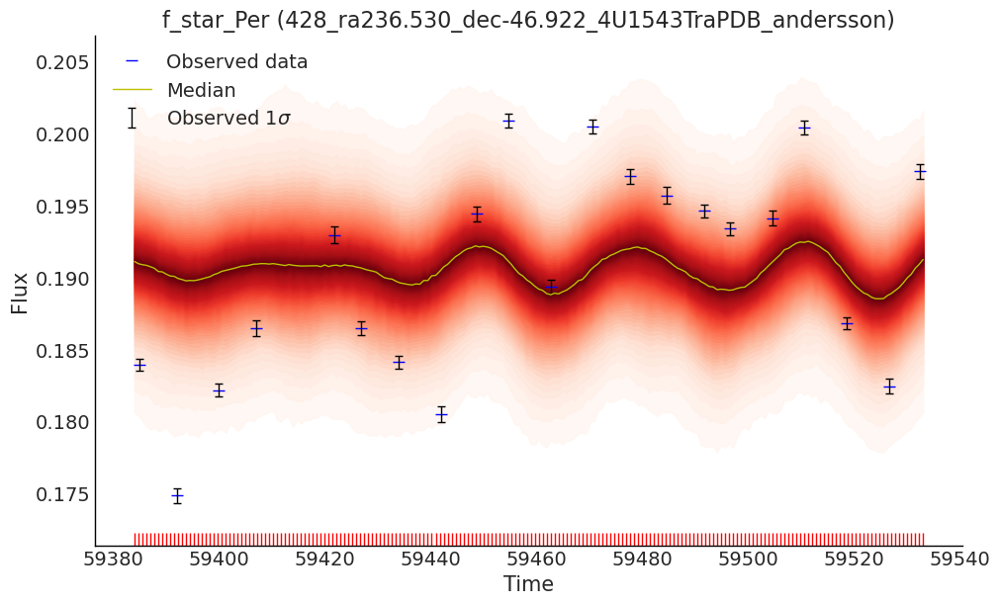

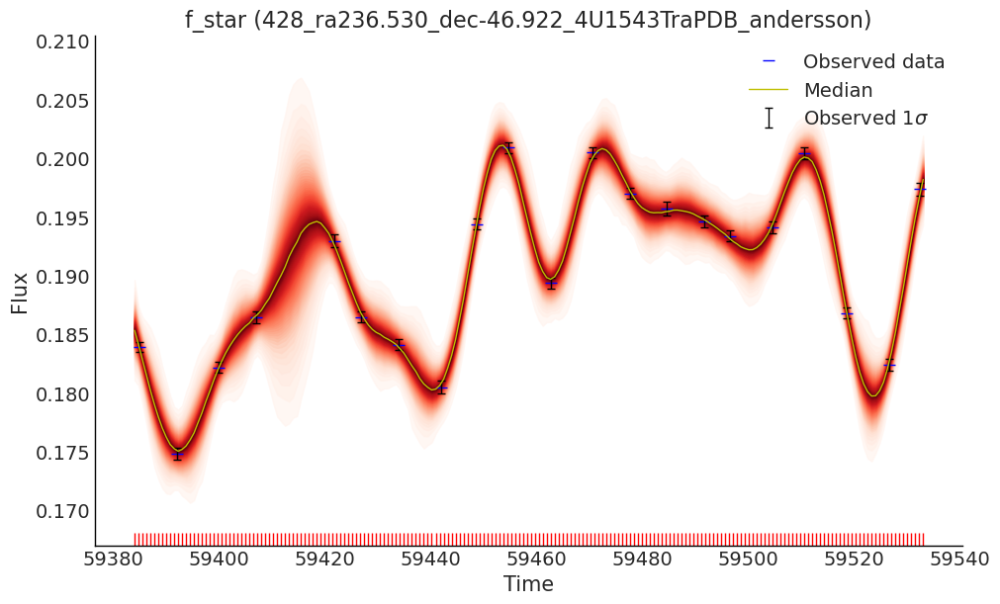

In [70]:
ufn.plot_postpred_samples(gpSE_gpPer_trace, "f_star_SE")
ufn.plot_postpred_samples(gpSE_gpPer_trace, "f_star_Per")
ufn.plot_postpred_samples(gpSE_gpPer_trace, "f_star")

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


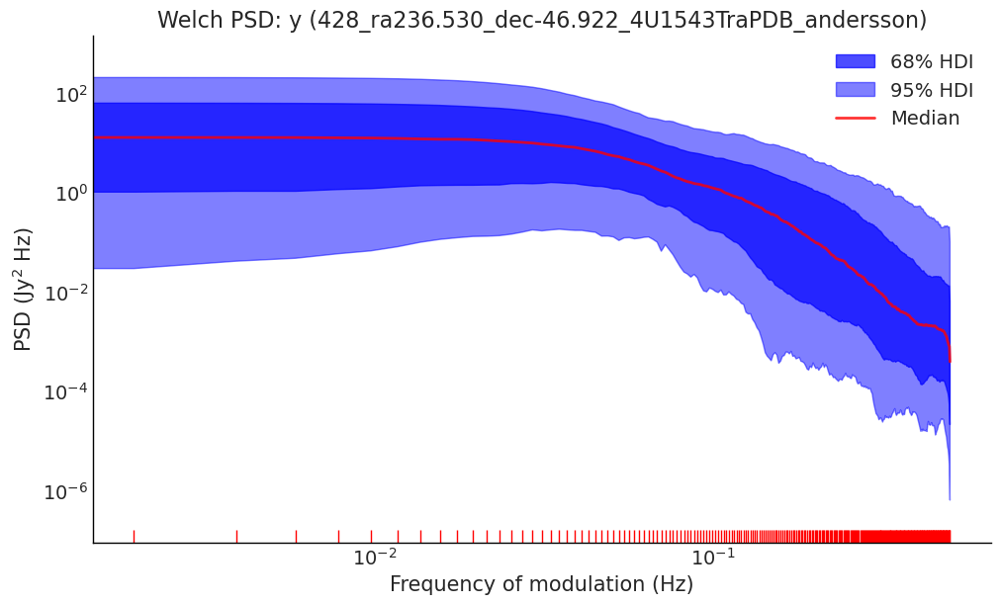

In [54]:
ufn.plot_welch_psd(gpSE_gpPer_trace, group="prior_predictive", variable_name="y")

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


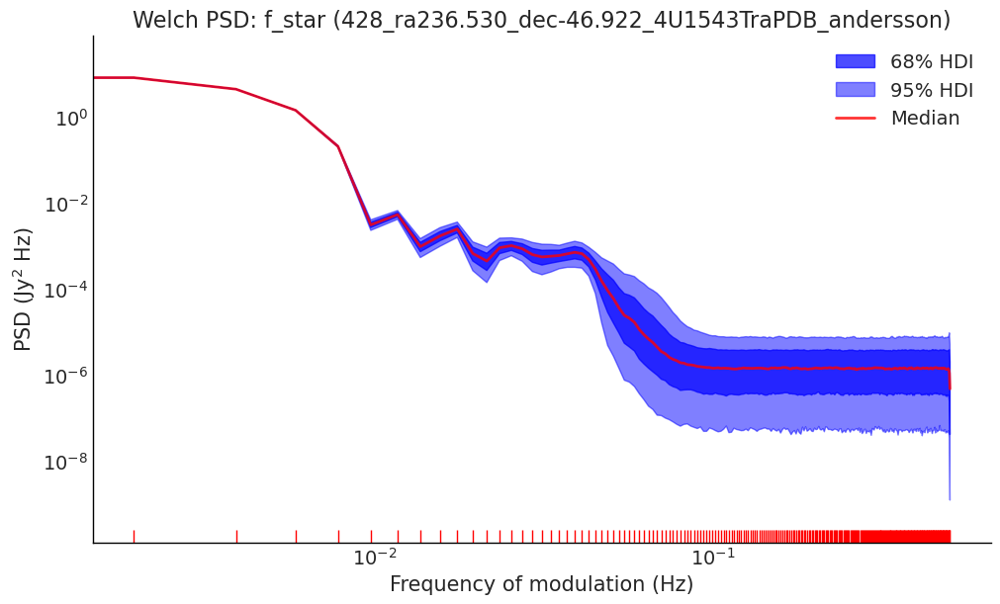

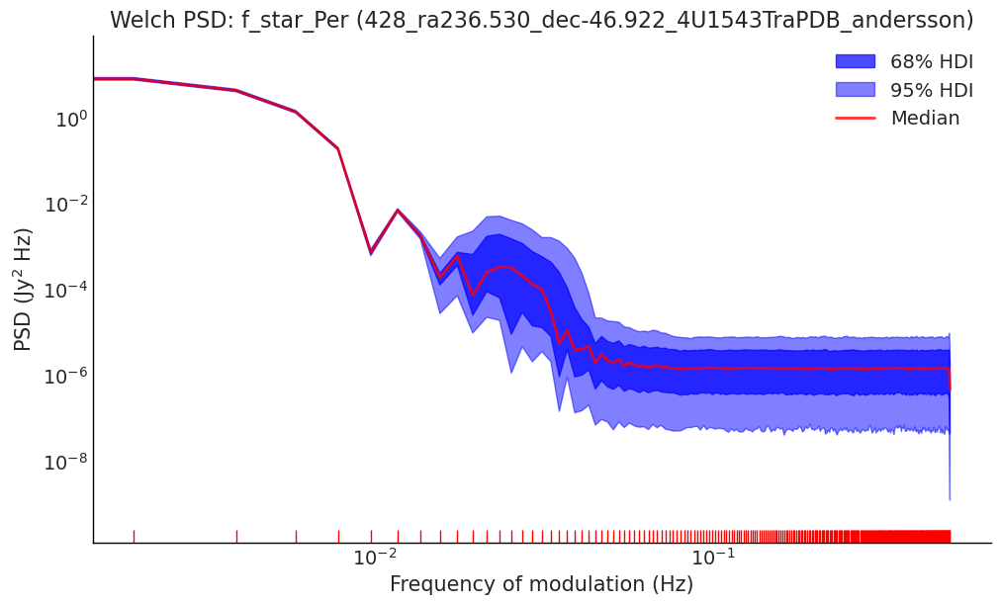

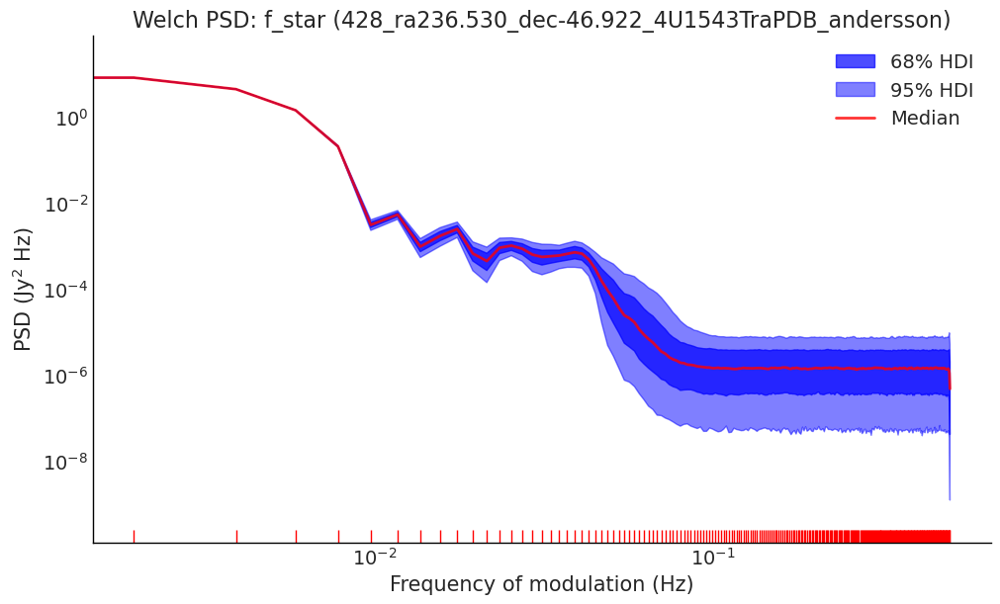

In [55]:
ufn.plot_welch_psd(gpSE_gpPer_trace, group="posterior_predictive", variable_name="f_star");
ufn.plot_welch_psd(gpSE_gpPer_trace, group="posterior_predictive", variable_name="f_star_Per");
ufn.plot_welch_psd(gpSE_gpPer_trace, group="posterior_predictive", variable_name="f_star");

/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/miniconda3/envs/pymc_env/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


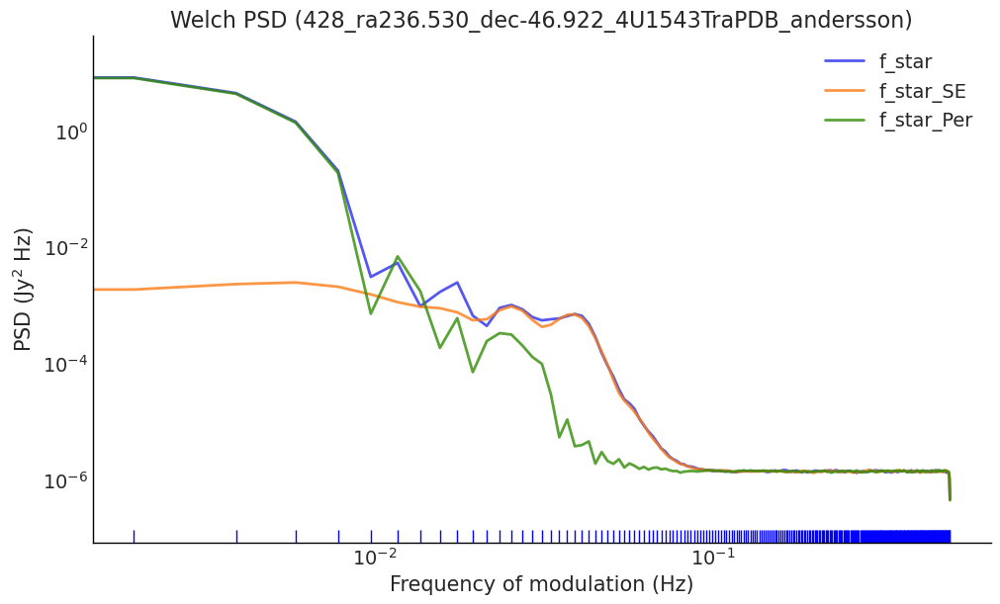

In [56]:
ufn.plot_welch_psds(gpSE_gpPer_trace, variable_names=["f_star", "f_star_SE", "f_star_Per"])

(0.0014801919594828097, 0.6597539553864471)

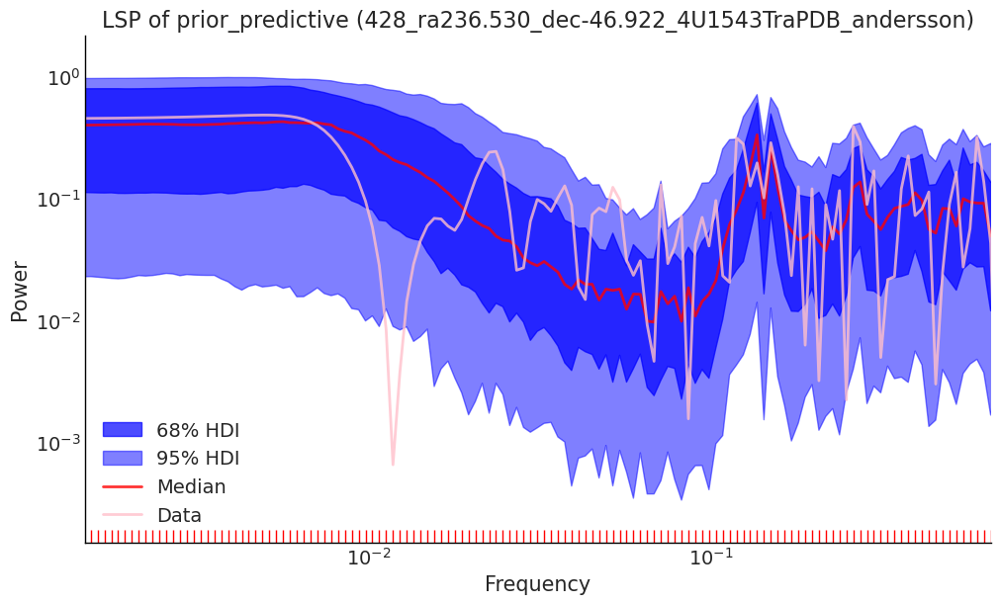

In [57]:
ufn.plot_lsp(gpSE_gpPer_trace, "prior_predictive", "y")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

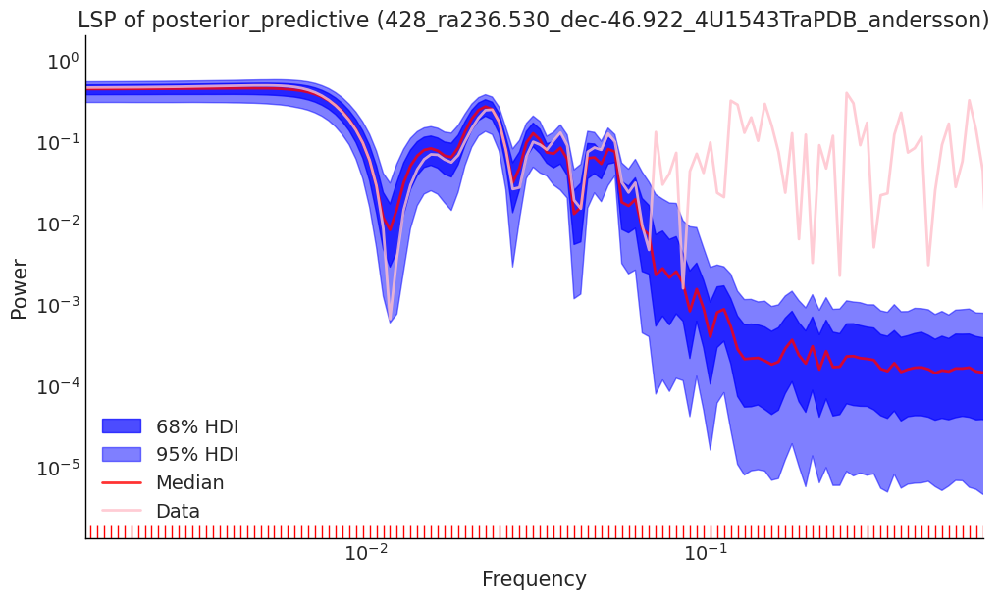

In [58]:
ufn.plot_lsp(gpSE_gpPer_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim)

(0.0014801919594828097, 0.6597539553864471)

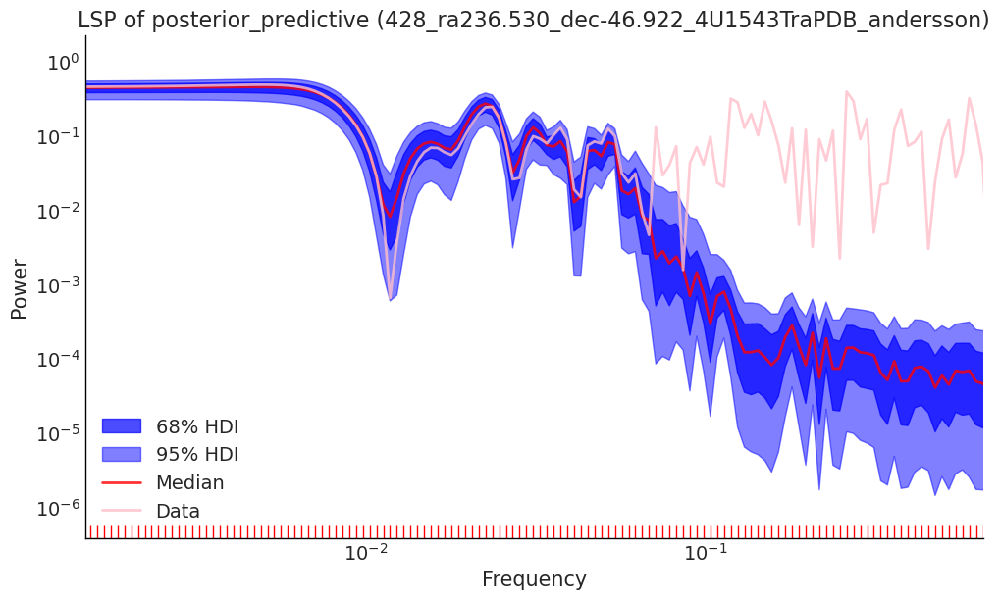

In [59]:
ufn.plot_lsp(gpSE_gpPer_trace, "posterior_predictive", "y_star")
plt.xlim(this_xlim)